# Supplementary display items — figures and tables with explanations

**Purpose.** This notebook assembles the Supplementary Information items of
the paper: the supplementary figures (SF), the supplementary tables (ST),
and pointers to the supplementary notes (SN). As in the main notebook,
every existing panel is the already-generated, checked artifact; each item
carries a source block naming the notebook and cell that made it. Three
figures at the end are new: they close a known re-export gap (quotable
results that never got a static figure).

**How to read this notebook.** Same pattern as the main notebook: a text
block, then a code cell that displays or composes the item and prints a
draft caption (collected into `exports/captions_appendix.txt`).

**Language.** Simplified technical English; every term of art is glossed
in the table below or where it first appears.

## Glossary — read this first

We use each term below many times. We give its plain meaning once, here.
The same word always has the same meaning in this notebook.

| Term | Plain meaning |
|---|---|
| **Schedule** | A target path for new US nuclear capacity, in gigawatts (GW), from now to 2050. The paper prices six schedules. It does not rank or endorse them. |
| **Mandate** | A rule added to the model: "at least this much new nuclear capacity must exist in year t." Each schedule becomes one mandate. |
| **ReEDS** | The national power-system planning model (NREL). It chooses the cheapest mix of plants and transmission that meets demand and all rules. |
| **Dual (shadow price)** | The price the model puts on the mandate rule. It equals the yearly rental payment, per kilowatt of mandated capacity, that would just make builders willing to build. Units: dollars per kW per year, in 2024 dollars. A dual of zero means the mandate needs no subsidy that year. |
| **Learning rate** | The percent cost drop each time total built capacity doubles. Example: a 10% learning rate means the second 10 GW costs 10% less per kW than the first 10 GW. |
| **Learning curve** | The cost path that a learning rate produces as capacity grows. |
| **OCC (overnight capital cost)** | The cost to build a plant if it could be built "overnight" — no construction-period interest. Units: \$/kW. |
| **Financed capex** | OCC plus the interest that accrues during the construction years. Long builds raise it. |
| **SMR / large** | The two reactor technology families: small modular reactors, and large conventional reactors. |
| **Cost world** | One complete random draw of all uncertain cost inputs (learning rates, starting costs, build durations, and so on). The Monte Carlo makes 10,000 worlds per schedule. |
| **P5 / P50 / P95 world** | Actual single draws ranked by total program cost: a cheap world (5th percentile), the median world, and an expensive world (95th percentile). |
| **Conditional cost trajectory** | A cost path that is only valid if its paired deployment schedule actually happens. None of our cost fans is a forecast. |
| **ITC (investment tax credit)** | The main US subsidy instrument: the government returns a set percentage of a plant's capital cost through the tax system. The current base credit (section 48E) is 30%, with bonuses up to about 50%. |
| **Model credit convention (i_model)** | The paper's headline rate convention: the credit is valued inside ReEDS's own financing arithmetic, where a credit dollar also carries construction-period carrying cost. Two real designs deliver it (a progress payment during construction, or a placed-in-service claim on the interest-inclusive tax basis), and both cost the government the same present value. The exported companion i_pis = i_model x ccmult converts to a placed-in-service credit on an overnight-cost-only basis. |
| **The floor / instrument menu** | The floor is the minimum net government cost that delivers the required support to every build — a flat dollar-per-MW payment at commissioning, elective pay. The menu prices every instrument as a multiple of it. |
| **κ (kappa) coupling** | A dial for how strongly the two technologies' cost uncertainties move together. κ = 1: what is expensive for one is expensive for the other. κ = 0: independent. |
| **EVPI (expected value of perfect information)** | The most that knowing the true cost world in advance could be worth, as a share of expected program cost. |
| **LP / reduced cost** | ReEDS solves a linear program (LP) — a cost-minimization with linear rules. A builder's "reduced cost" is its cost disadvantage at the optimum; zero means it is competitive at the margin. |

In [1]:
import pandas as pd

import paperlib as P
from paperlib import MC_FIG, MC_EXP, S3_FIG, S3_EXP, S4_FIG, S4_EXP, S3C_EXP, S4C_EXP

pd.set_option("display.max_columns", 40)
pd.set_option("display.width", 160)
TO2024 = P.to2024()
print(f"repo: {P.REPO}")
print(f"2004$ -> 2024$ multiplier (from inputs/financials/deflator.csv): {TO2024:.4f}")

repo: C:\Users\ethan\code\research\ReEDS-nuclear-learning
2004$ -> 2024$ multiplier (from inputs/financials/deflator.csv): 1.6590


## Supplementary Notes (SN1–SN5) — pointers

The five supplementary notes are text, not display items. They are drafted
from these sources:

| Note | Content | Source of record |
|---|---|---|
| SN1 | The Monte Carlo engine and its priors (the cost model, the copula, spillover routing, the duration model) | `z-ethan/paper plan.md` (engine sections) + `mc/mc_cost_trajectories.ipynb` |
| SN2 | The ITC translation procedure (dual → required credit rate, 9 steps) | `z-ethan/step3_analysis/ITC calculation procedure.md` |
| SN3 | The technology-comparison claims ledger C1–C7, with the pre-registered failures | `z-ethan/tech-comparison-notebook-spec.md` + `mc/tech_comparison.ipynb` |
| SN4 | Case selection: joint-draw discipline and the layered coverage claim | `z-ethan/paper plan.md` (case-selection sections) + `mc/smr100_case_export.ipynb` |
| SN5 | Validation registries (pilot forensics; output checks) | `z-ethan/step3_checks/`, `z-ethan/step4_checks/` (summaries in ST8 below) |

## SF1 — Which uncertain inputs move 2050 costs (Spearman sensitivities)

**What this shows.** For each schedule, the rank correlation between every
uncertain input dial and the financed 2050 capital cost. Rank correlation
(Spearman) asks: when this dial is high, is cost high — regardless of the
exact functional form?

**Key result.** Two dials dominate everywhere: the starting cost (positive)
and the learning rate (negative). The minor dials matter little on their
own. This is why the case design ranks worlds by program cost rather than
by any single input.

z-ethan\mc\figures\tornado_fincapex.png  (generated 2026-08-17 14:46)


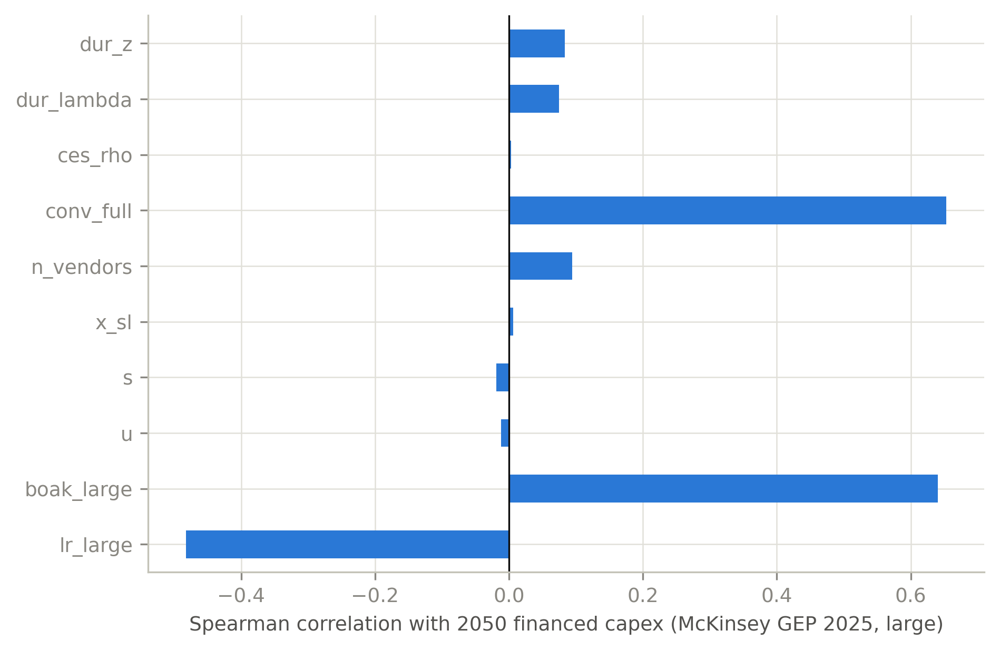

**Sources — edit the figure at its origin, not here:**

- `z-ethan\mc\figures\tornado_fincapex.png` — generated by `mc/mc_cost_trajectories.ipynb` (cell 41) from Spearman rank correlations over the 10,000 worlds per schedule; table: `mc/exports/sensitivity_spearman.csv`

z-ethan\mc\exports\sensitivity_spearman.csv


,EIA 2026 AEO high,Abou-Jaoude mod,IAEA high,McKinsey GEP 2025,COP28 tripling pledge,2025 EO
lr_large,-0.414,-0.423,-0.468,-0.482,-0.517,-0.546
boak_large,0.780,0.725,0.674,0.640,0.604,0.584
u,-0.002,-0.022,-0.002,-0.012,-0.005,-0.005
s,-0.035,-0.028,-0.019,-0.019,0.012,0.005
x_sl,-0.001,0.018,-0.016,0.006,-0.004,0.010
n_vendors,0.093,0.129,0.119,0.094,0.059,0.056
conv_full,0.474,0.534,0.609,0.653,0.657,0.660
ces_rho,-0.087,-0.046,-0.028,0.003,0.015,0.015
dur_lambda,0.104,0.081,0.086,0.075,0.049,0.065
dur_z,0.159,0.153,0.103,0.083,0.076,0.080


In [2]:
P.show_panel(MC_FIG / "tornado_fincapex.png")
P.source_ref(
    (MC_FIG / "tornado_fincapex.png", "mc/mc_cost_trajectories.ipynb", "cell 41",
     "Spearman rank correlations over the 10,000 worlds per schedule; table: `mc/exports/sensitivity_spearman.csv`"),
)
P.table(MC_EXP / "sensitivity_spearman.csv", index_col=0, round_=3)

## SF2 — Construction-duration medians by schedule

**What this shows.** The build-duration model's output: median construction
duration by year and schedule, for both technologies. Durations shorten as
programs mature; they drive financed capex through construction-period
interest, and they are drawn jointly with costs (same copula — a copula is
the statistical device that ties the draws of several uncertain inputs
together so they move consistently).

z-ethan\mc\figures\duration_medians_by_schedule.png  (generated 2026-08-17 14:45)


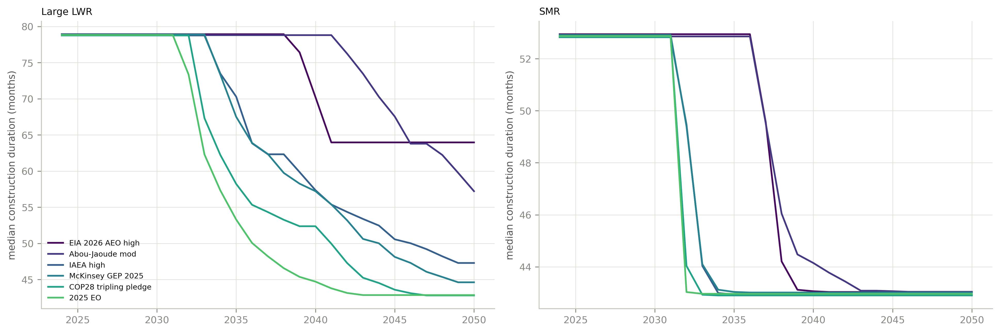

**Sources — edit the figure at its origin, not here:**

- `z-ethan\mc\figures\duration_medians_by_schedule.png` — generated by `mc/mc_cost_trajectories.ipynb` (cell 24) from the INL duration model inside the MC; percentiles: `mc/exports/mc_duration_percentiles_by_schedule.csv`

In [3]:
P.show_panel(MC_FIG / "duration_medians_by_schedule.png")
P.source_ref(
    (MC_FIG / "duration_medians_by_schedule.png", "mc/mc_cost_trajectories.ipynb", "cell 24",
     "the INL duration model inside the MC; percentiles: `mc/exports/mc_duration_percentiles_by_schedule.csv`"),
)

## SF3 — Hindcast: where history falls in the sampled learning-rate range

**What this shows.** We check the priors against history. Korea's realized
learning (+13% per doubling over 1972–2008) sits at the 77th percentile of
our sampled industry-rate range. France (−15%) and the United States (−30%)
experienced negative learning — costs rose with experience — and fall
**below** the sampled support.

**How to read it, precisely.** The priors reproduce successful-program
experience and exclude negative learning **by design**. This is a scope
statement, not a validation of optimism: the paper says so wherever the
fans appear, and the limitation is repeated in the Discussion.

z-ethan\mc\figures\hindcast_learning_rates.png  (generated 2026-08-17 14:46)


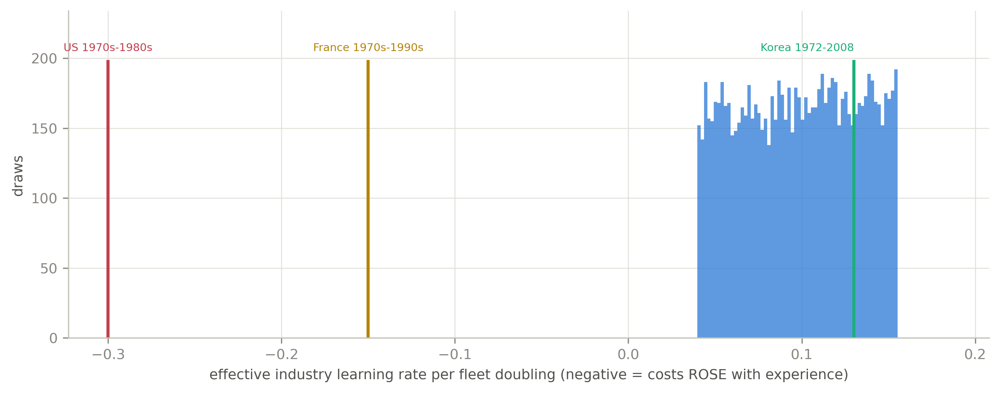

**Sources — edit the figure at its origin, not here:**

- `z-ethan\mc\figures\hindcast_learning_rates.png` — generated by `mc/mc_cost_trajectories.ipynb` (cell 49) from sampled industry-rate distribution + literature rates (Lovering 2016; Grubler 2010; Eash-Gates 2020); table: `mc/exports/hindcast_positions.csv`

z-ethan\mc\exports\hindcast_positions.csv


,observed_rate,position
Korea 1972-2008 (Lovering et al. 2016),0.13,P77 of the sampled range
France 1970s-1990s (Grubler 2010),-0.15,BELOW the sampled support
US 1970s-1980s (Eash-Gates et al. 2020),-0.30,BELOW the sampled support


In [4]:
P.show_panel(MC_FIG / "hindcast_learning_rates.png")
P.source_ref(
    (MC_FIG / "hindcast_learning_rates.png", "mc/mc_cost_trajectories.ipynb", "cell 49",
     "sampled industry-rate distribution + literature rates (Lovering 2016; Grubler 2010; Eash-Gates 2020); table: `mc/exports/hindcast_positions.csv`"),
)
P.table(MC_EXP / "hindcast_positions.csv", index_col=0)

## SF4 — Dominance tests: the program-cost distributions compared

**What this shows.** The cumulative cost distributions of the 100%-SMR and
100%-large programs, per schedule, with formal dominance tests. "First-order
stochastic dominance" (FSD) means one program is cheaper at every
probability level; "second-order" (SSD) means every risk-averse decision
maker prefers it. The tests are exact (every draw checked), and the
pre-registered failures are reported in the claims ledger (ST1).

z-ethan\mc\figures\tc_dominance_cdfs.png  (generated 2026-08-17 15:08)


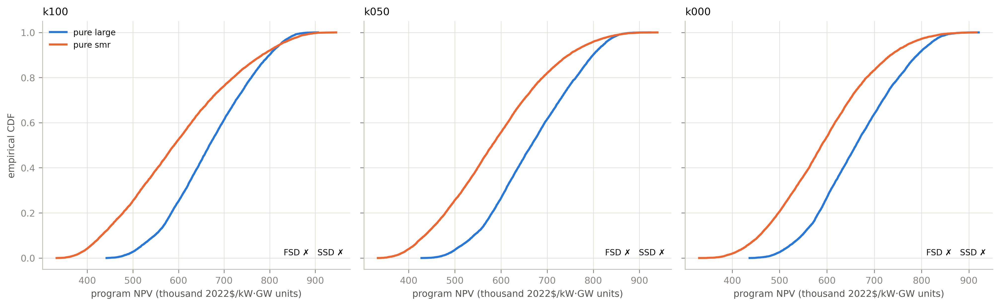

**Sources — edit the figure at its origin, not here:**

- `z-ethan\mc\figures\tc_dominance_cdfs.png` — generated by `mc/tech_comparison.ipynb` (cell 23) from per-draw program costs from `mc_perdraw.npz`; results: `mc/exports/tech_comparison/dominance_tests.csv`

z-ethan\mc\exports\tech_comparison\dominance_tests.csv


,cell,schedule,FSD_smr,SSD_smr,crossing_cost,crossing_pct_of_median,CVaR95_smr_le_large,E_smr_le_large
0,k100,EIA 2026 AEO high,False,False,1.734827e+05,117.1044,False,True
1,k100,Abou-Jaoude mod,False,False,2.468551e+05,125.1822,False,True
2,k100,IAEA high,False,False,6.153974e+05,130.7257,False,True
3,k100,McKinsey GEP 2025,False,False,7.812180e+05,132.2734,False,True
4,k100,COP28 tripling pledge,False,False,1.460474e+06,139.3900,False,True
5,k100,2025 EO,False,False,2.231940e+06,144.2490,False,True
6,k075,EIA 2026 AEO high,False,False,1.867924e+05,126.6907,False,True
7,k075,Abou-Jaoude mod,False,False,2.701922e+05,138.2410,True,True
8,k075,IAEA high,False,False,6.511381e+05,141.1249,True,True
9,k075,McKinsey GEP 2025,False,False,8.296008e+05,144.5040,True,True


In [5]:
P.show_panel(MC_FIG / "tc_dominance_cdfs.png")
P.source_ref(
    (MC_FIG / "tc_dominance_cdfs.png", "mc/tech_comparison.ipynb", "cell 23",
     "per-draw program costs from `mc_perdraw.npz`; results: `mc/exports/tech_comparison/dominance_tests.csv`"),
)
P.table(MC_EXP / "tech_comparison" / "dominance_tests.csv", round_=4)

## SF5 — Where the winner flips in the cost-gap plane

**What this shows.** Each draw placed by its two cost gaps (learning-rate
gap and starting-cost gap between the technologies), with the winner-flip
boundary drawn per dependence cell. It localizes the ambiguity: the flip
boundary moves with the dependence assumption, but always stays inside the
slow-learning, large-favorable corner.

z-ethan\mc\figures\tc_gapplane_boundaries.png  (generated 2026-08-17 15:08)


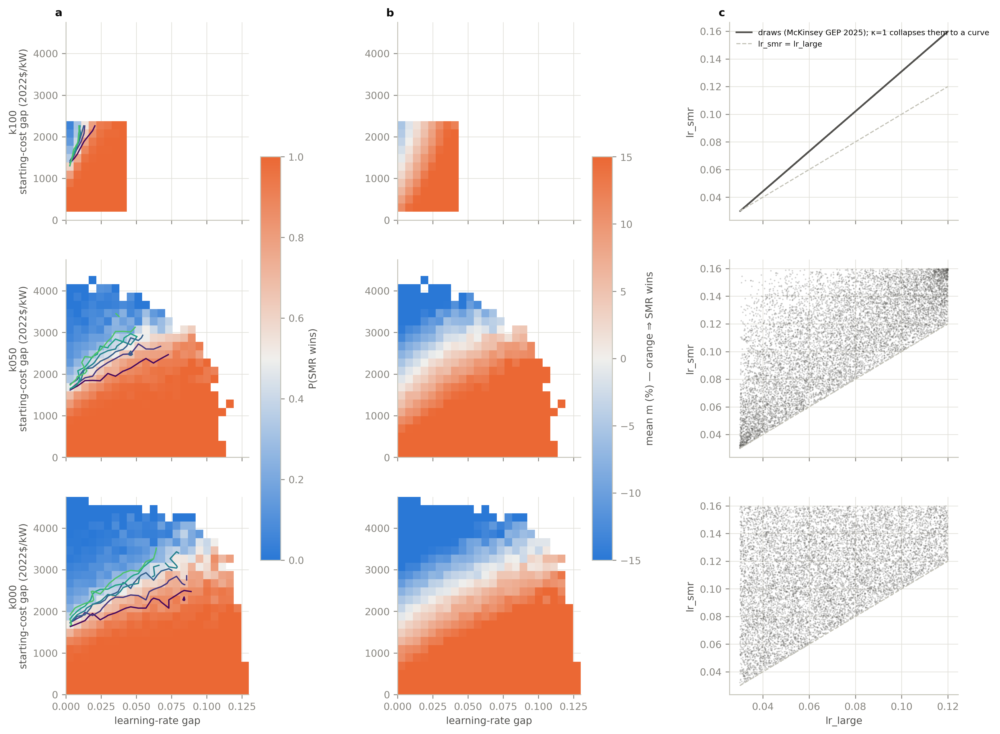

**Sources — edit the figure at its origin, not here:**

- `z-ethan\mc\figures\tc_gapplane_boundaries.png` — generated by `mc/tech_comparison.ipynb` (cell 20) from per-draw gaps and winners across the κ grid (`mc/exports/tech_comparison/perdraw/`)

In [6]:
P.show_panel(MC_FIG / "tc_gapplane_boundaries.png")
P.source_ref(
    (MC_FIG / "tc_gapplane_boundaries.png", "mc/tech_comparison.ipynb", "cell 20",
     "per-draw gaps and winners across the κ grid (`mc/exports/tech_comparison/perdraw/`)"),
)

## SF6 — Mixed builds: does any split beat the pure programs?

**What this shows.** A per-draw optimizer searches all mixed strategies
(splitting the program between the technologies in any share). Maps show
where in parameter space a mix would win and by how much.

**Key result.** Mixes beat the best pure program in 10 of 60,000 draws, by
at most 0.51%. Fragmentation costs (split learning) dominate hedging value
almost everywhere.

composed -> z-ethan\paper_figures\figures\SF6_mixed_build.png  (7087x3668 px)


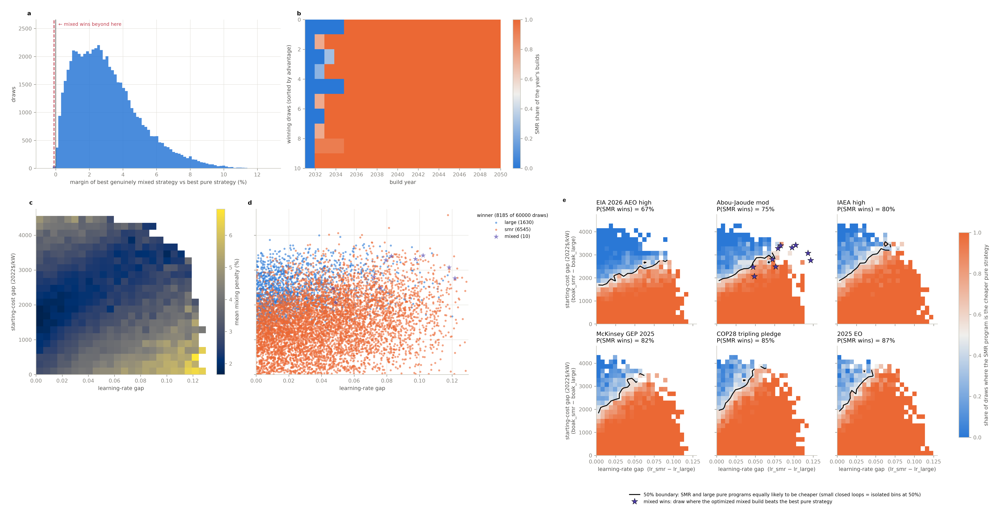

**Sources — edit the figure at its origin, not here:**

- `z-ethan\mc\figures\mixed_build_advantage.png` — generated by `mc/mixed_build_optimizer.ipynb` (cell 28) from its own draw set over `US_SCHEDULES.csv` + ReEDS financials
- `z-ethan\mc\figures\mixed_build_margin_map.png` — generated by `mc/mixed_build_optimizer.ipynb` (cell 30) from same optimizer output
- `z-ethan\mc\figures\mixed_build_parameter_space.png` — generated by `mc/mixed_build_optimizer.ipynb` (cell 31) from same optimizer output


--- draft caption [SF6] ---
Mixed-build optimizer results: where any split of the program between the two technologies would
beat the best pure program, and by how much. Mixes win in 10 of 60,000 draws, by at most 0.51%:
splitting the program splits the learning.


In [7]:
P.compose(
    [[MC_FIG / "mixed_build_advantage.png"],
     [MC_FIG / "mixed_build_margin_map.png", MC_FIG / "mixed_build_parameter_space.png"]],
    "SF6_mixed_build.png",
    letters=["", "", "e"],  # first two sources carry a,b / c,d themselves
)
P.source_ref(
    (MC_FIG / "mixed_build_advantage.png", "mc/mixed_build_optimizer.ipynb", "cell 28",
     "its own draw set over `US_SCHEDULES.csv` + ReEDS financials"),
    (MC_FIG / "mixed_build_margin_map.png", "mc/mixed_build_optimizer.ipynb", "cell 30",
     "same optimizer output"),
    (MC_FIG / "mixed_build_parameter_space.png", "mc/mixed_build_optimizer.ipynb", "cell 31",
     "same optimizer output"),
)
P.caption("SF6", '''
Mixed-build optimizer results: where any split of the program between the two
technologies would beat the best pure program, and by how much. Mixes win in 10 of
60,000 draws, by at most 0.51%: splitting the program splits the learning.
''')

## SF7 — The value of perfect information (EVPI)

**What this shows.** What would it be worth to know the true cost world
before committing the program? Total EVPI and its decomposition (which
uncertainty carries the value), by dependence cell.

**Key results.** EVPI is 0.57–0.66% of expected program cost under the
tightest coupling, rising to 2.3–4.6% fully decoupled (up to about 6.0% at
the decoupled-anchor probe). The value concentrates in the learning-rate gap
under tight coupling and flips to the starting-cost gap when decoupled.
These are upper bounds: no realistic noisy-signal tier is modeled.

z-ethan\mc\figures\tc_evpi.png  (generated 2026-08-17 15:08)


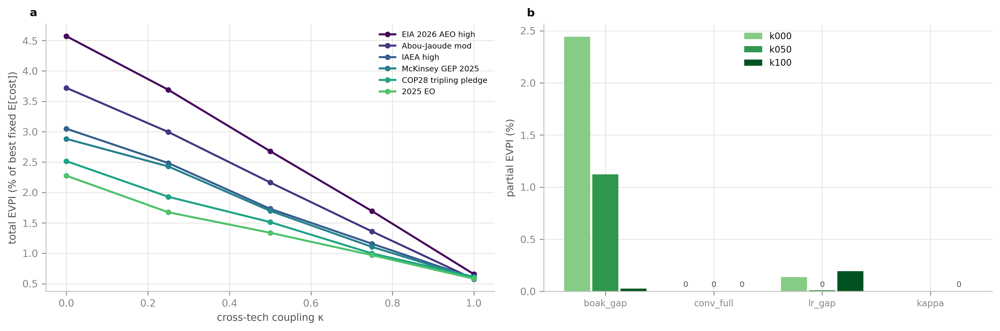

**Sources — edit the figure at its origin, not here:**

- `z-ethan\mc\figures\tc_evpi.png` — generated by `mc/tech_comparison.ipynb` (cell 27) from per-draw program costs; tables: `mc/exports/tech_comparison/evpi_total.csv`, `evpi_partial.csv`

z-ethan\mc\exports\tech_comparison\evpi_total.csv


,cell,schedule,EVPI,EVPI_pct
0,k100,EIA 2026 AEO high,978.1889,0.6555
1,k100,Abou-Jaoude mod,1144.3248,0.5741
2,k100,IAEA high,2814.4135,0.5894
3,k100,McKinsey GEP 2025,3526.8598,0.5883
4,k100,COP28 tripling pledge,6583.5674,0.6138
5,k100,2025 EO,9199.5193,0.5802
6,k075,EIA 2026 AEO high,2501.6026,1.6934
7,k075,Abou-Jaoude mod,2673.9892,1.3587
8,k075,IAEA high,5398.7695,1.1570
9,k075,McKinsey GEP 2025,6443.2969,1.1052


In [8]:
P.show_panel(MC_FIG / "tc_evpi.png")
P.source_ref(
    (MC_FIG / "tc_evpi.png", "mc/tech_comparison.ipynb", "cell 27",
     "per-draw program costs; tables: `mc/exports/tech_comparison/evpi_total.csv`, `evpi_partial.csv`"),
)
P.table(MC_EXP / "tech_comparison" / "evpi_total.csv", round_=4)

## SF8 — The 2036 switch bound (adaptive commitment)

**What this shows.** A cheaper form of information value: commit now, but
allow one perfect-information switch of technology in 2036. The recoverable
value is at most 0.12–0.66% of program cost under tight coupling (maximum
5.88% at the decoupled-anchor probe — a pre-registered failure case,
reported as such). Early commitment forfeits little in coherent worlds.

z-ethan\mc\figures\tc_adaptive_bound.png  (generated 2026-08-17 15:08)


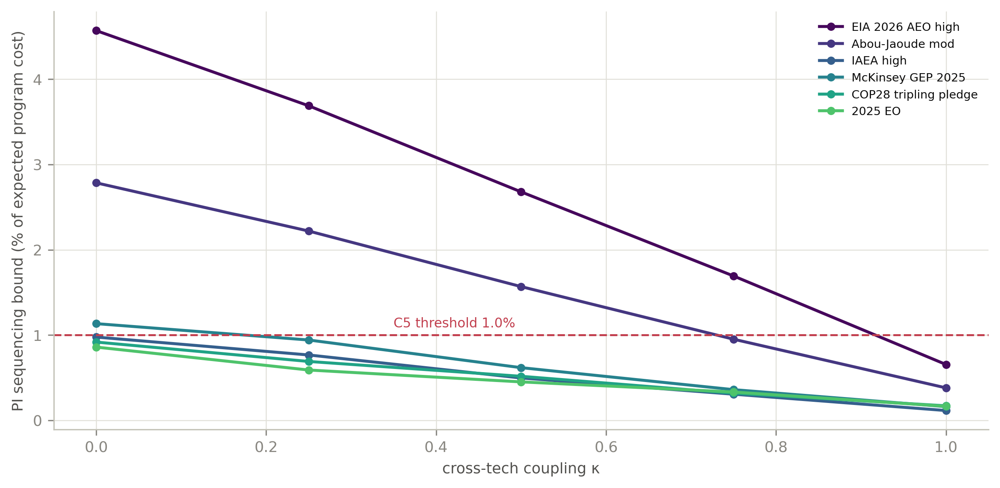

**Sources — edit the figure at its origin, not here:**

- `z-ethan\mc\figures\tc_adaptive_bound.png` — generated by `mc/tech_comparison.ipynb` (cell 25) from per-draw program costs with a 2036 switch; table: `mc/exports/tech_comparison/adaptive_value.csv`

z-ethan\mc\exports\tech_comparison\adaptive_value.csv


,cell,schedule,E_best_fixed,V_perfect_info,bound_raw,bound_pct
0,k100,EIA 2026 AEO high,1.492202e+05,1.482420e+05,978.1889,0.6555
1,k100,Abou-Jaoude mod,1.993274e+05,1.985674e+05,760.0558,0.3813
2,k100,IAEA high,4.775154e+05,4.769641e+05,551.3141,0.1155
3,k100,McKinsey GEP 2025,5.994948e+05,5.985291e+05,965.7750,0.1611
4,k100,COP28 tripling pledge,1.072546e+06,1.070713e+06,1833.6750,0.1710
5,k100,2025 EO,1.585679e+06,1.583063e+06,2615.9849,0.1650
6,k075,EIA 2026 AEO high,1.477297e+05,1.452281e+05,2501.6026,1.6934
7,k075,Abou-Jaoude mod,1.967990e+05,1.949256e+05,1873.3593,0.9519
8,k075,IAEA high,4.666279e+05,4.651943e+05,1433.5455,0.3072
9,k075,McKinsey GEP 2025,5.830033e+05,5.809017e+05,2101.6171,0.3605


In [9]:
P.show_panel(MC_FIG / "tc_adaptive_bound.png")
P.source_ref(
    (MC_FIG / "tc_adaptive_bound.png", "mc/tech_comparison.ipynb", "cell 25",
     "per-draw program costs with a 2036 switch; table: `mc/exports/tech_comparison/adaptive_value.csv`"),
)
P.table(MC_EXP / "tech_comparison" / "adaptive_value.csv", round_=4)

## SF9 — Which mandated years actually bind

**What this shows.** For every run and every mandated year: does the
mandate bind (dual > 0), or is the floor already exceeded (slack)? Slack
years are "needs no subsidy" years — a legitimate pricing outcome. The
cheapest EIA world overbuilds its floor by 3% by 2047; every large-reactor
comparator holds two slack early years because the existing fleet covers
the floor.

z-ethan\step3_analysis\figures\f02_binding_heatmap.png  (generated 2026-08-18 14:52)


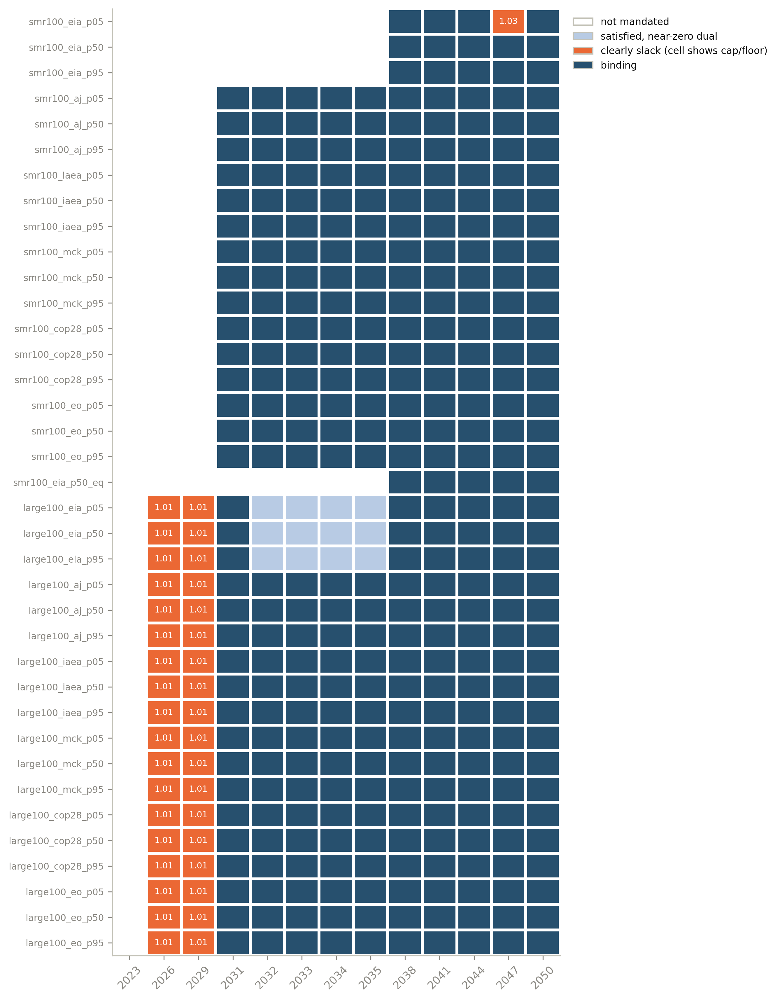

**Sources — edit the figure at its origin, not here:**

- `z-ethan\step3_analysis\figures\f02_binding_heatmap.png` — generated by `step3_analysis/step3_analysis.ipynb` (cell 14) from `step3_checks/exports/duals_by_year.csv` (+ step4 for large100)

In [10]:
P.show_panel(S3_FIG / "f02_binding_heatmap.png")
P.source_ref(
    (S3_FIG / "f02_binding_heatmap.png", "step3_analysis/step3_analysis.ipynb", "cell 14",
     "`step3_checks/exports/duals_by_year.csv` (+ step4 for large100)"),
)

## SF10 — Mandate floor against built capacity

**What this shows.** The mandated floor and the capacity the model actually
builds, per case. Where the built line sits above the floor, the mandate is
slack and the dual is zero. This is the picture behind the binding/slack
flags in SF9.

z-ethan\step3_analysis\figures\f03_mandate_vs_cap.png  (generated 2026-08-18 14:52)


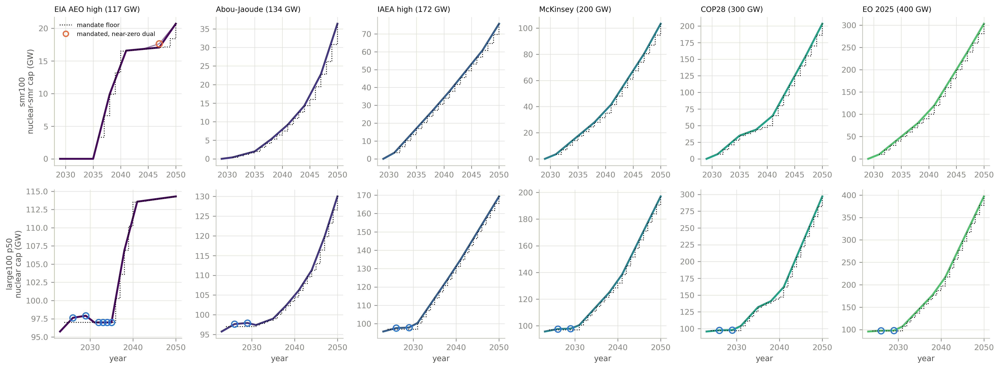

**Sources — edit the figure at its origin, not here:**

- `z-ethan\step3_analysis\figures\f03_mandate_vs_cap.png` — generated by `step3_analysis/step3_analysis.ipynb` (cell 15) from checks duals/capacity + `inputs/nuclear_learning/nuclear_cap_trajectory_*.csv`

In [11]:
P.show_panel(S3_FIG / "f03_mandate_vs_cap.png")
P.source_ref(
    (S3_FIG / "f03_mandate_vs_cap.png", "step3_analysis/step3_analysis.ipynb", "cell 15",
     "checks duals/capacity + `inputs/nuclear_learning/nuclear_cap_trajectory_*.csv`"),
)

## SF11 — Rental-transfer fans (fiscal flow by year)

**What this shows.** The yearly fiscal flow of the rental-transfer
benchmark: dual × mandated capacity, by year and case. This is the flow
whose present value appears in Table 2. (Figure 4's panel b became the
instrument menu on 2026-08-18, so this page now ships the rental-transfer
exhibit.)

z-ethan\step3_analysis\figures\f12_rental_transfer.png  (generated 2026-08-18 14:52)

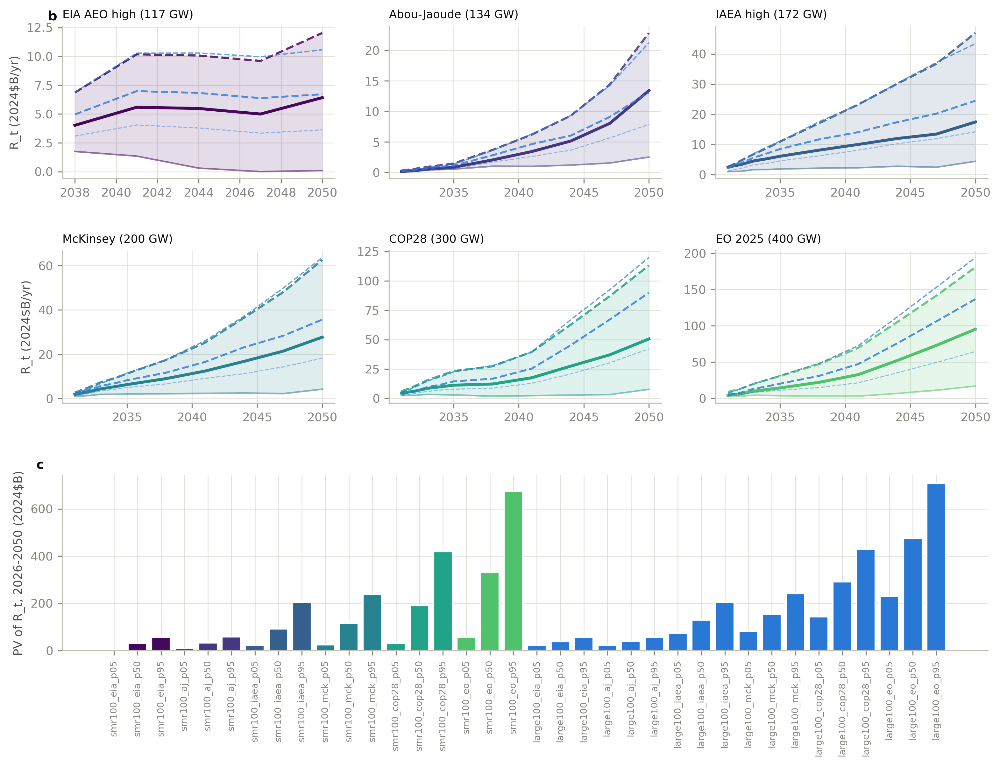

**Sources — edit the figure at its origin, not here:**

- `z-ethan\step3_analysis\figures\f12_rental_transfer.png` — generated by `step3_analysis/step3_analysis.ipynb` (cell 35) from checks duals x mandate, discounted; table: `t08_rental_transfer.csv`

In [12]:
P.show_panel(S3_FIG / "f12_rental_transfer.png")
P.source_ref(
    (S3_FIG / "f12_rental_transfer.png", "step3_analysis/step3_analysis.ipynb", "cell 35",
     "checks duals x mandate, discounted; table: `t08_rental_transfer.csv`"),
)

## SF11b — The floor, the flat grant, and the credit, net of tax

**What this shows.** The instrument-cost comparison behind the menu. Under
symmetric scoring — every commissioning-date dollar, grant or credit
alike, valued through ReEDS's own financing arithmetic — the minimum net
cost that delivers the required support is the floor: a flat dollar-per-MW
payment at commissioning, 4% below the taxable flat cash grant. The
uniform percentage credit costs 1.17–1.25x the floor, obeying the exact
identity net ratio = capex overshoot / (1 − penalty): the ~10%
monetization haircut (tax-equity — the market where developers sell tax
credits they cannot use themselves — takes a cut) plus a 5–13% oversubsidy
from quoting a flat dollar need as a uniform percentage of heterogeneous
capital bases — two frictions, nothing else. Gross budget scoring
reverses the ranking (the credit looks 4–10% cheaper than the grant) and
is shown as the budget-scoring line only. State-resolved or
dollar-denominated rates remove the oversubsidy; elective pay removes the
haircut; the two together attain the floor.

z-ethan\step3_analysis\figures\t13_instrument_comparison.png  (generated 2026-08-18 14:53)


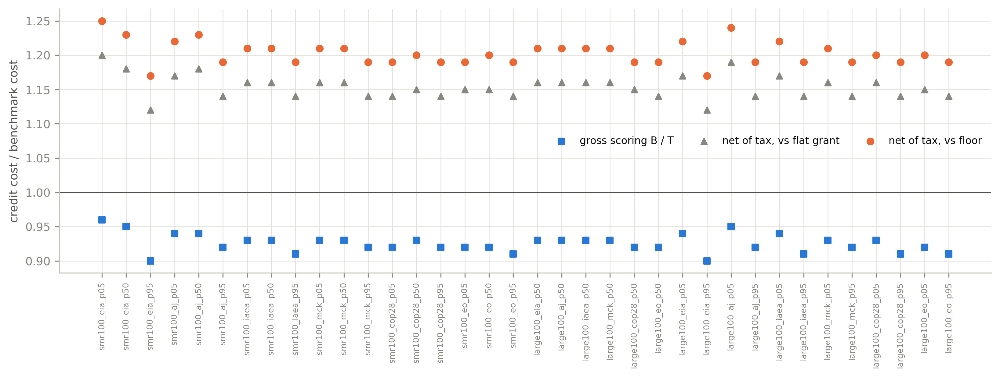

**Sources — edit the figure at its origin, not here:**

- `z-ethan\step3_analysis\figures\t13_instrument_comparison.png` — generated by `step3_analysis/step3_analysis.ipynb` (cell t13fg001 (regenerated 2026-08-18, symmetric scoring)) from `t13_flat_grant.csv` + `t14_itc_resolution.csv`

z-ethan\step3_analysis\exports\t13_flat_grant.csv
smr100 — net vs floor: 1.17-1.25; net vs flat grant: 1.12-1.20; gross: 0.90-0.96
large100 — net vs floor: 1.17-1.24; net vs flat grant: 1.12-1.19; gross: 0.90-0.95

--- draft caption [SF11b] ---
The floor, the flat grant, and the credit. Under symmetric scoring the uniform percentage credit
costs 1.17-1.25x the minimum-cost floor (identity: net ratio = overshoot/(1-0.1)) and 1.12-1.20x
the taxable flat grant; gross budget scoring reverses the ranking (0.90-0.96x) and is a budget-
scoring figure only. The two frictions - the ~10% monetization haircut and the 5-13% uniform-
rate oversubsidy - are both removable (elective pay; dollar-per-MW denomination), so a credit
can attain the floor within the tax code.


In [13]:
P.show_panel(S3_FIG / "t13_instrument_comparison.png")
P.source_ref(
    (S3_FIG / "t13_instrument_comparison.png", "step3_analysis/step3_analysis.ipynb",
     "cell t13fg001 (regenerated 2026-08-18, symmetric scoring)",
     "`t13_flat_grant.csv` + `t14_itc_resolution.csv`"),
)
t13 = P.table(S3_EXP / "t13_flat_grant.csv", round_=3)
smr = t13[t13["case"].str.startswith("smr100") & ~t13["case"].str.endswith("_eq")]
lrg = t13[t13["case"].str.startswith("large100")]
for name, fam in (("smr100", smr), ("large100", lrg)):
    print(f"{name} — net vs floor: "
          f"{fam['net_ratio_vs_floor'].min():.2f}-{fam['net_ratio_vs_floor'].max():.2f}; "
          f"net vs flat grant: {fam['net_ratio_vs_grant'].min():.2f}-{fam['net_ratio_vs_grant'].max():.2f}; "
          f"gross: {fam['gross_scoring_ratio'].min():.2f}-{fam['gross_scoring_ratio'].max():.2f}")
P.caption("SF11b", '''
The floor, the flat grant, and the credit. Under symmetric scoring the uniform percentage
credit costs 1.17-1.25x the minimum-cost floor (identity: net ratio = overshoot/(1-0.1)) and
1.12-1.20x the taxable flat grant; gross budget scoring reverses the ranking (0.90-0.96x)
and is a budget-scoring figure only. The two frictions - the ~10% monetization haircut and
the 5-13% uniform-rate oversubsidy - are both removable (elective pay; dollar-per-MW
denomination), so a credit can attain the floor within the tax code.
''')

## SF12 — The myopia wedge

**What this shows.** ReEDS solves year by year without foresight (myopic).
An investor with foresight would not need the same subsidy path. The wedge
is bracketed between two accounting conventions ("cut" and "hold"):
hold-to-required ratios run 0.23–1.82 and converge to 1.00 for 2050 builds.
Early-build subsidies priced myopically exceed the full-foresight
requirement when the dual path declines. (No foresight runs exist: NREL
reports the intertemporal solver has been broken for years, so this
analytical bracket is the quantitative substitute.)

z-ethan\step3_analysis\figures\f14_myopia_wedge.png  (generated 2026-08-18 14:52)


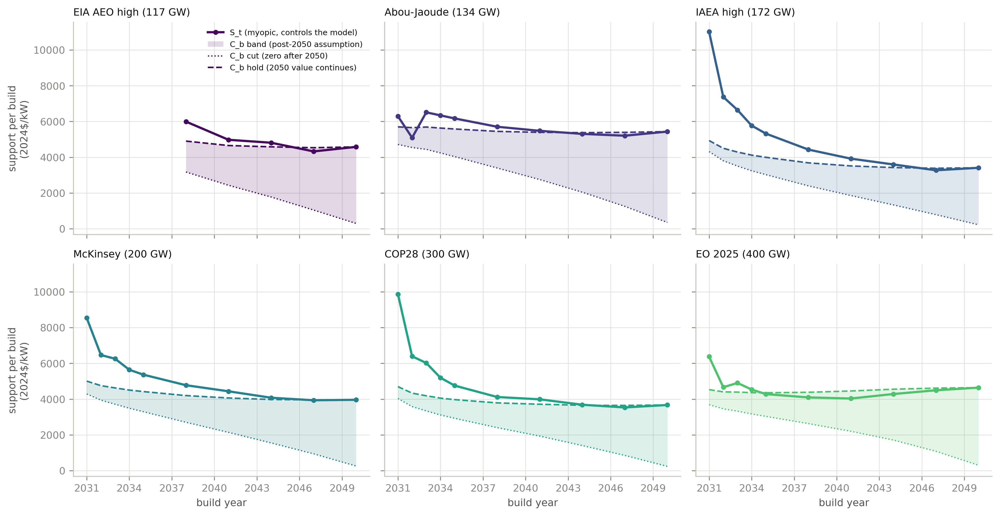

**Sources — edit the figure at its origin, not here:**

- `z-ethan\step3_analysis\figures\f14_myopia_wedge.png` — generated by `step3_analysis/step3_analysis.ipynb` (cell 44) from duals + `t09` + pvf_onm; table: `t11_myopia_wedge.csv`

In [14]:
P.show_panel(S3_FIG / "f14_myopia_wedge.png")
P.source_ref(
    (S3_FIG / "f14_myopia_wedge.png", "step3_analysis/step3_analysis.ipynb", "cell 44",
     "duals + `t09` + pvf_onm; table: `t11_myopia_wedge.csv`"),
)

## SF13 — System-cost anatomy

**What this shows.** Where the mandate's system cost goes: the cost
decomposition by bucket (capital, fuel, operations, transmission, ...) for
a reference case, and total system cost by case. These support the fiscal
magnitudes in the main text; no mandate-versus-no-mandate welfare claim is
made anywhere (no no-mandate baseline exists by design).

composed -> z-ethan\paper_figures\figures\SF13_cost_anatomy.png  (3811x3480 px)


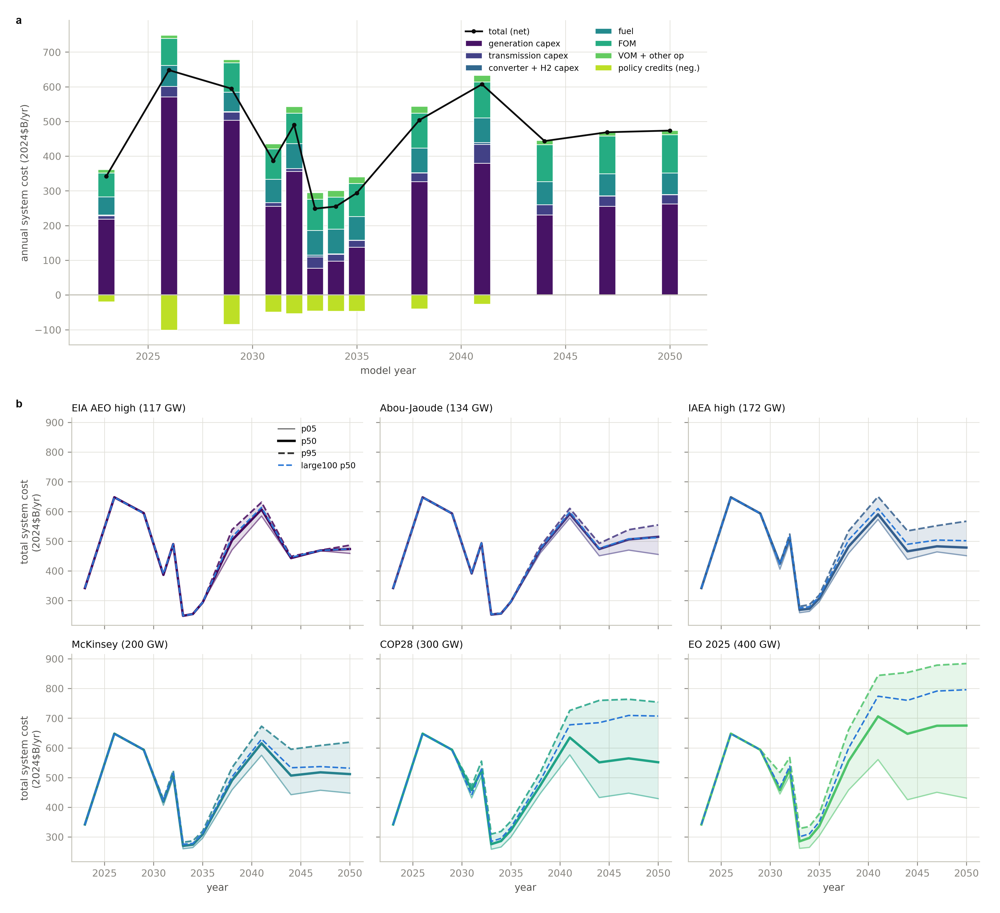

**Sources — edit the figure at its origin, not here:**

- `z-ethan\step3_analysis\figures\f08_cost_decomposition_ref.png` — generated by `step3_analysis/step3_analysis.ipynb` (cell 29) from h5 `systemcost` bucketed; table: `t05_systemcost_by_case.csv`
- `z-ethan\step3_analysis\figures\f09_cost_totals.png` — generated by `step3_analysis/step3_analysis.ipynb` (cell 30) from same buckets, totals; deltas: `t06_cost_deltas.csv`

In [15]:
P.compose(
    [[S3_FIG / "f08_cost_decomposition_ref.png"],
     [S3_FIG / "f09_cost_totals.png"]],
    "SF13_cost_anatomy.png",
)
P.source_ref(
    (S3_FIG / "f08_cost_decomposition_ref.png", "step3_analysis/step3_analysis.ipynb", "cell 29",
     "h5 `systemcost` bucketed; table: `t05_systemcost_by_case.csv`"),
    (S3_FIG / "f09_cost_totals.png", "step3_analysis/step3_analysis.ipynb", "cell 30",
     "same buckets, totals; deltas: `t06_cost_deltas.csv`"),
)

## SF14 — Cost spread within schedules, and program NPV against ambition

**What this shows.** Left: how much total system cost varies across the
three cost worlds of the same schedule (the drawn world matters more than
the schedule). Right: program net present value against schedule ambition.
Cross-schedule comparisons conflate the schedule and the drawn world; the
paper says so wherever they appear.

composed -> z-ethan\paper_figures\figures\SF14_spread_and_npv.png  (5492x1420 px)


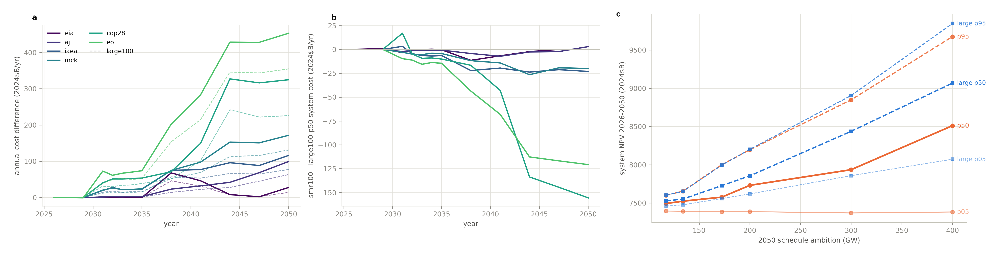

**Sources — edit the figure at its origin, not here:**

- `z-ethan\step3_analysis\figures\f10_within_schedule_spread.png` — generated by `step3_analysis/step3_analysis.ipynb` (cell 31) from `t06_cost_deltas.csv`
- `z-ethan\step3_analysis\figures\f11_npv_vs_ambition.png` — generated by `step3_analysis/step3_analysis.ipynb` (cell 33) from `t07_system_npv.csv`

In [16]:
P.compose(
    [[S3_FIG / "f10_within_schedule_spread.png", S3_FIG / "f11_npv_vs_ambition.png"]],
    "SF14_spread_and_npv.png",
    letters=["", "c"],  # f10 carries a,b itself
)
P.source_ref(
    (S3_FIG / "f10_within_schedule_spread.png", "step3_analysis/step3_analysis.ipynb", "cell 31",
     "`t06_cost_deltas.csv`"),
    (S3_FIG / "f11_npv_vs_ambition.png", "step3_analysis/step3_analysis.ipynb", "cell 33",
     "`t07_system_npv.csv`"),
)

## SF15–SF17 — ATB inversion detail

**What this shows.** The detail behind Figure 5. SF15: how closely the best
sampled worlds fit each ATB trajectory (fit envelopes). SF16: which dial
values the near-fitting worlds require (dial marginals), per technology.
SF17: the cross-pairing check — each ATB cost trajectory tested against
every deployment pairing, showing the internal inconsistencies (some
trajectories fit better under other schedules than their own).

z-ethan\mc\figures\atb_fit_envelopes.png  (generated 2026-08-17 14:47)


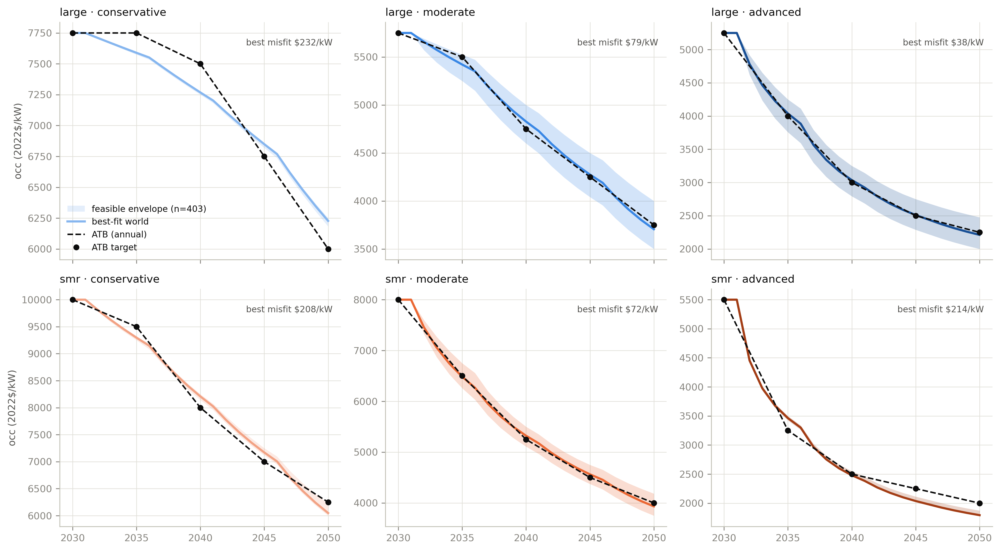

composed -> z-ethan\paper_figures\figures\SF16_atb_dial_marginals.png  (7904x2008 px)


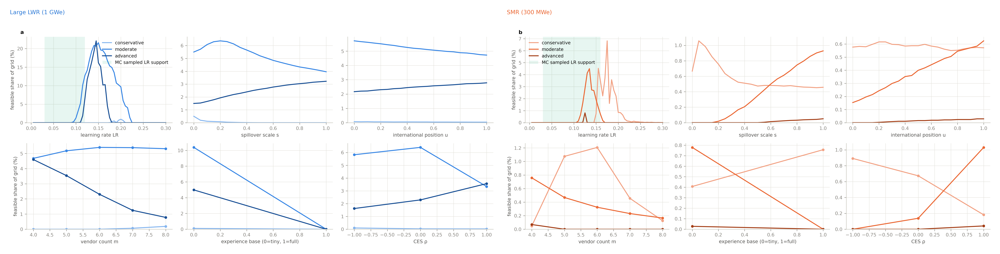

z-ethan\mc\figures\atb_cross_pairing.png  (generated 2026-08-17 14:47)


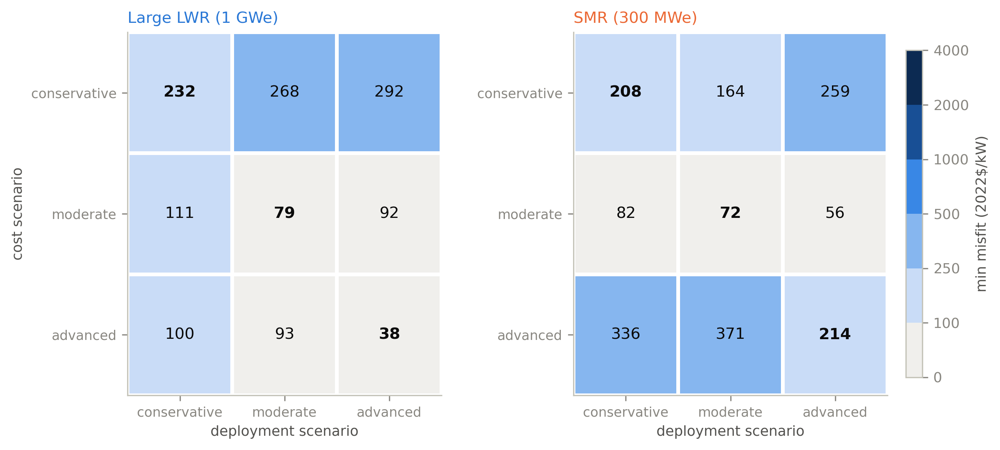

**Sources — edit the figure at its origin, not here:**

- `z-ethan\mc\figures\atb_fit_envelopes.png` — generated by `mc/atb_parameter_space.ipynb` (figure cells) from per-world misfit grids (`mc/exports/atb/`)
- `z-ethan\mc\figures\atb_dial_marginals_large.png` — generated by `mc/atb_parameter_space.ipynb` (figure cells) from feasible-set worlds (`mc/exports/atb/feasible_set_*.csv.gz`)
- `z-ethan\mc\figures\atb_dial_marginals_smr.png` — generated by `mc/atb_parameter_space.ipynb` (figure cells) from feasible-set worlds, SMR
- `z-ethan\mc\figures\atb_cross_pairing.png` — generated by `mc/atb_parameter_space.ipynb` (figure cells) from `mc/exports/atb/cross_pairing_misfit.csv`

In [17]:
P.show_panel(MC_FIG / "atb_fit_envelopes.png")
P.compose(
    [[MC_FIG / "atb_dial_marginals_large.png", MC_FIG / "atb_dial_marginals_smr.png"]],
    "SF16_atb_dial_marginals.png",
    letters="",  # sources carry a/b themselves (compose letters collided
                 # with the block titles, 2026-08-17 audit)
)
P.show_panel(MC_FIG / "atb_cross_pairing.png")
P.source_ref(
    (MC_FIG / "atb_fit_envelopes.png", "mc/atb_parameter_space.ipynb", "figure cells",
     "per-world misfit grids (`mc/exports/atb/`)"),
    (MC_FIG / "atb_dial_marginals_large.png", "mc/atb_parameter_space.ipynb", "figure cells",
     "feasible-set worlds (`mc/exports/atb/feasible_set_*.csv.gz`)"),
    (MC_FIG / "atb_dial_marginals_smr.png", "mc/atb_parameter_space.ipynb", "figure cells",
     "feasible-set worlds, SMR"),
    (MC_FIG / "atb_cross_pairing.png", "mc/atb_parameter_space.ipynb", "figure cells",
     "`mc/exports/atb/cross_pairing_misfit.csv`"),
)

## SF18 — Where the priced cases sit in the drawn distribution

**What this shows.** The case-selection picture: the P5/P50/P95 cases are
actual joint draws, ranked by discounted program cost, and this shows where
each selected draw sits in its schedule's distribution, plus the selected
cases' full cost fans. The layered coverage claim (90% on program cost by
construction; 0.62–0.81 simultaneous path coverage; 0.83–0.92 one-sided
below-P95) is documented in ST2/ST3.

composed -> z-ethan\paper_figures\figures\SF18_case_placement.png  (3975x4149 px)


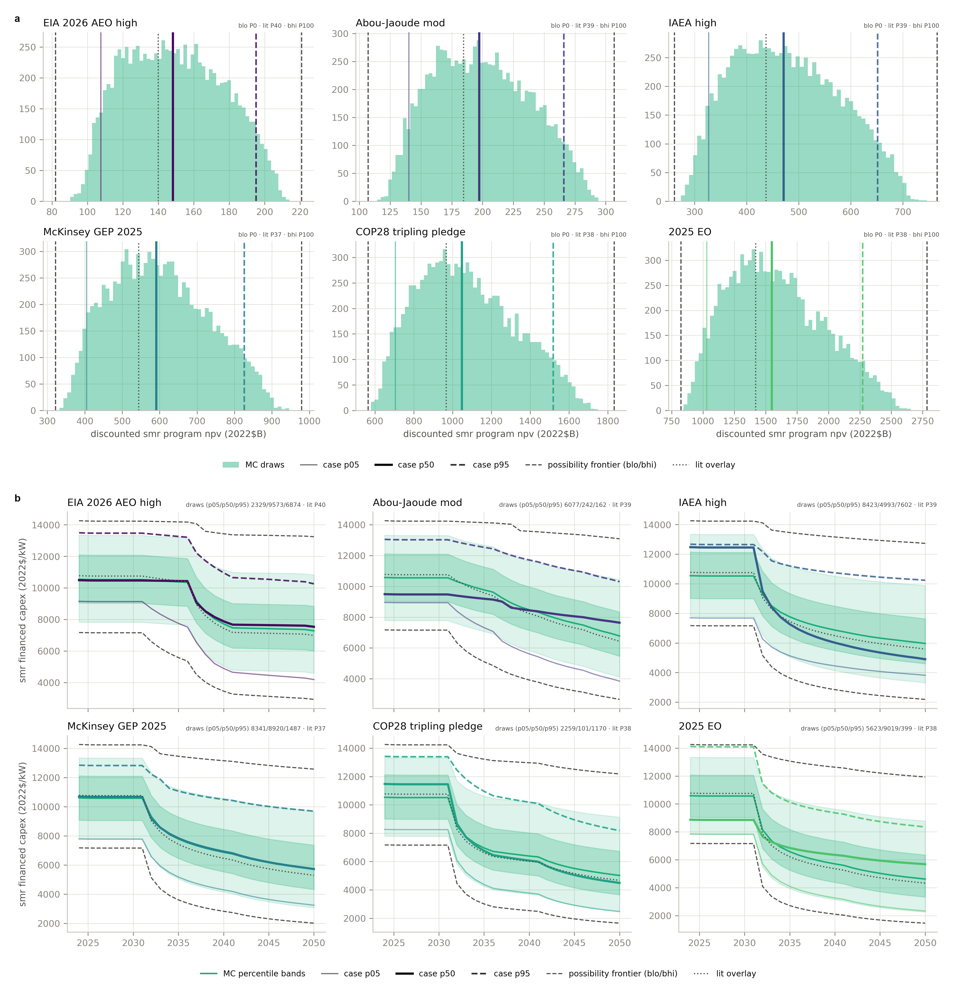

**Sources — edit the figure at its origin, not here:**

- `z-ethan\mc\figures\smr100_case_placement.png` — generated by `mc/smr100_case_export.ipynb` (figure cells) from the ranked draw distribution + selected draws (`mc/exports/smr100/selected_draws.csv`)
- `z-ethan\mc\figures\smr100_selected_cases_fan.png` — generated by `mc/smr100_case_export.ipynb` (figure cells) from selected draws' trajectories

In [18]:
P.compose(
    [[MC_FIG / "smr100_case_placement.png"],
     [MC_FIG / "smr100_selected_cases_fan.png"]],
    "SF18_case_placement.png",
)
P.source_ref(
    (MC_FIG / "smr100_case_placement.png", "mc/smr100_case_export.ipynb", "figure cells",
     "the ranked draw distribution + selected draws (`mc/exports/smr100/selected_draws.csv`)"),
    (MC_FIG / "smr100_selected_cases_fan.png", "mc/smr100_case_export.ipynb", "figure cells",
     "selected draws' trajectories"),
)

## SF19 — Case-design diagnostics

**What this shows.** Three checks behind the case design. One-at-a-time
(OAT) linearity: program cost responds near-linearly to each dial alone.
The s×conv interaction: the one material two-dial interaction (spillover ×
experience-base convention). The MC trend check: the ranked-draw selection
is stable across the MC's internal ordering.

composed -> z-ethan\paper_figures\figures\SF19_case_design_diagnostics.png  (6694x5314 px)


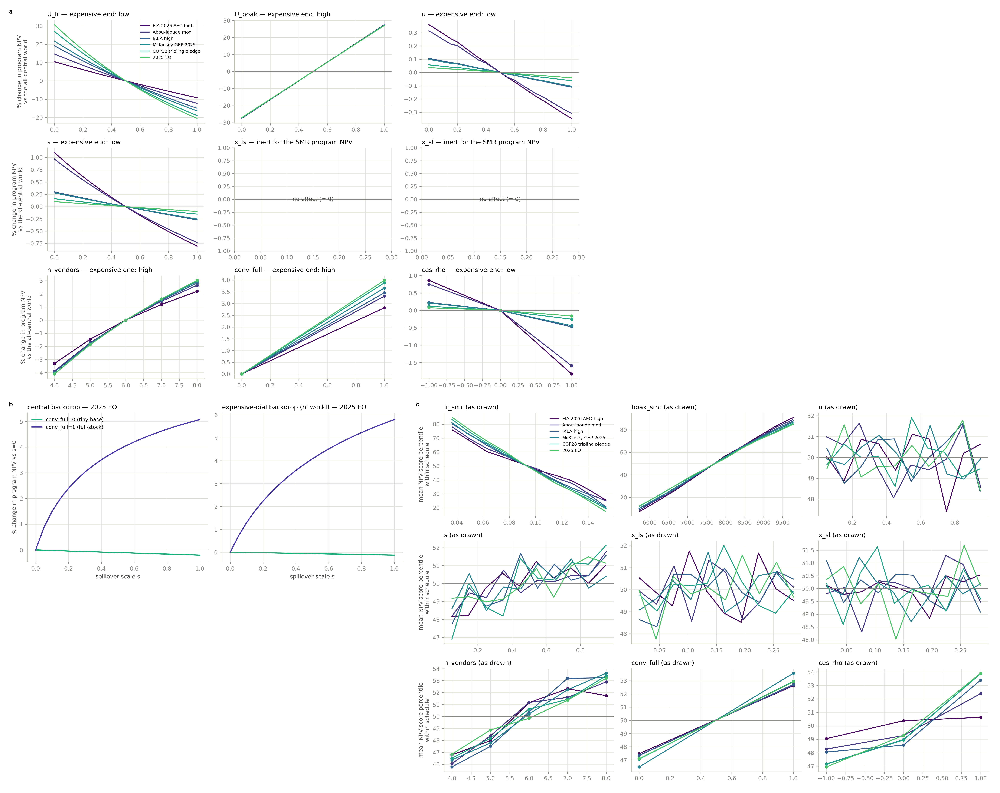

**Sources — edit the figure at its origin, not here:**

- `z-ethan\mc\figures\smr100_oat_linearity.png` — generated by `mc/smr100_case_export.ipynb` (diagnostic cells) from OAT sweeps around the selected draws
- `z-ethan\mc\figures\smr100_s_conv_interaction.png` — generated by `mc/smr100_case_export.ipynb` (diagnostic cells) from two-dial interaction sweep
- `z-ethan\mc\figures\smr100_mc_trend_check.png` — generated by `mc/smr100_case_export.ipynb` (diagnostic cells) from ranking-stability check

In [19]:
P.compose(
    [[MC_FIG / "smr100_oat_linearity.png"],
     [MC_FIG / "smr100_s_conv_interaction.png", MC_FIG / "smr100_mc_trend_check.png"]],
    "SF19_case_design_diagnostics.png",
)
P.source_ref(
    (MC_FIG / "smr100_oat_linearity.png", "mc/smr100_case_export.ipynb", "diagnostic cells",
     "OAT sweeps around the selected draws"),
    (MC_FIG / "smr100_s_conv_interaction.png", "mc/smr100_case_export.ipynb", "diagnostic cells",
     "two-dial interaction sweep"),
    (MC_FIG / "smr100_mc_trend_check.png", "mc/smr100_case_export.ipynb", "diagnostic cells",
     "ranking-stability check"),
)

## SF20 — Binding-year shifts across market worlds

**What this shows.** The step4 sensitivity detail behind Figure 6: which
mandated years bind, per case and market world. A high gas-price world
removes up to six binding years (gas competes less, nuclear needs less
help) — but never restores decay in an expensive world.

z-ethan\step4_analysis\figures\g01_binding_heatmap.png  (generated 2026-08-18 15:11)


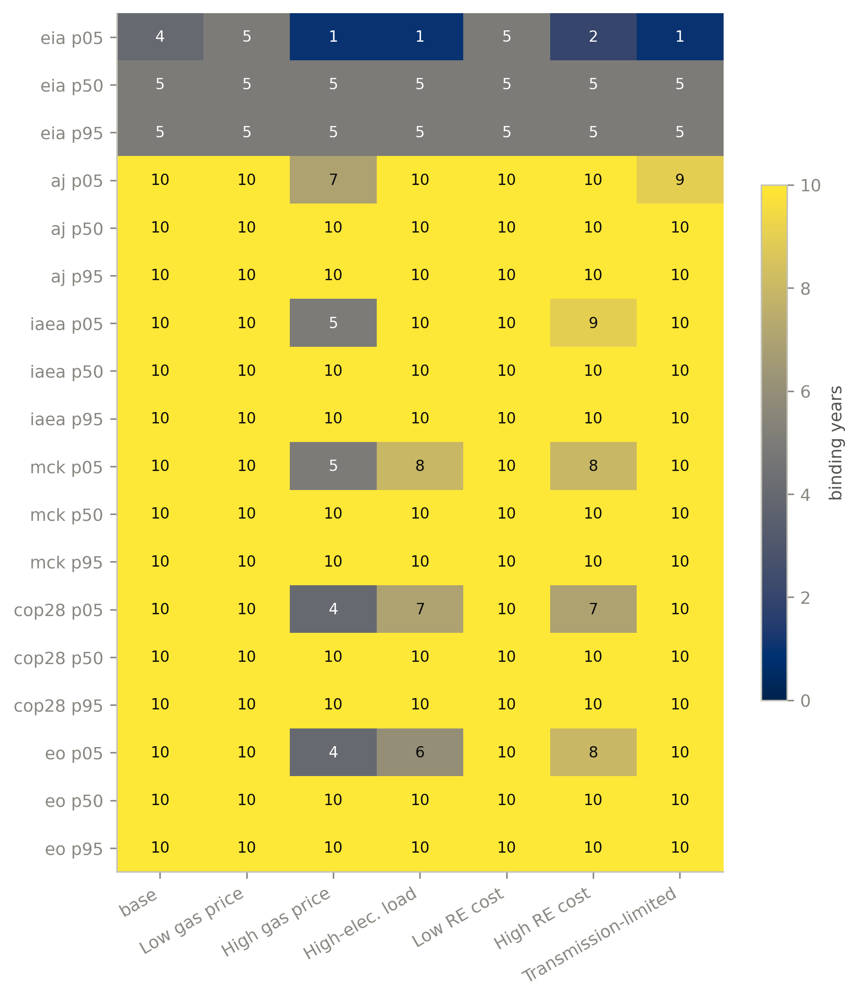

**Sources — edit the figure at its origin, not here:**

- `z-ethan\step4_analysis\figures\g01_binding_heatmap.png` — generated by `step4_analysis/step4_analysis.ipynb` (cell 8) from `step4_analysis/exports/s01_binding_shifts.csv`

In [20]:
P.show_panel(S4_FIG / "g01_binding_heatmap.png")
P.source_ref(
    (S4_FIG / "g01_binding_heatmap.png", "step4_analysis/step4_analysis.ipynb", "cell 8",
     "`step4_analysis/exports/s01_binding_shifts.csv`"),
)

## SF21 — Does the ambition ordering survive each market world?

**What this shows.** The schedules ranked by fiscal bill in every market
world × percentile cell (a "bump chart": lines that stay flat mean the
ordering survives). Kendall τ — a rank-agreement score, 1 = identical
order — is at least 0.867 against base in every cell, mean 0.993. The
mean-binding-dual metric shows adjacent swaps in 13 of its 18
sensitivity × percentile cells (the fiscal-bill metric swaps in 1 of 18),
concentrated in cheap worlds; the raw orderings are exported (`s03`).

z-ethan\step4_analysis\figures\g04_ranking_bump.png  (generated 2026-08-18 15:11)


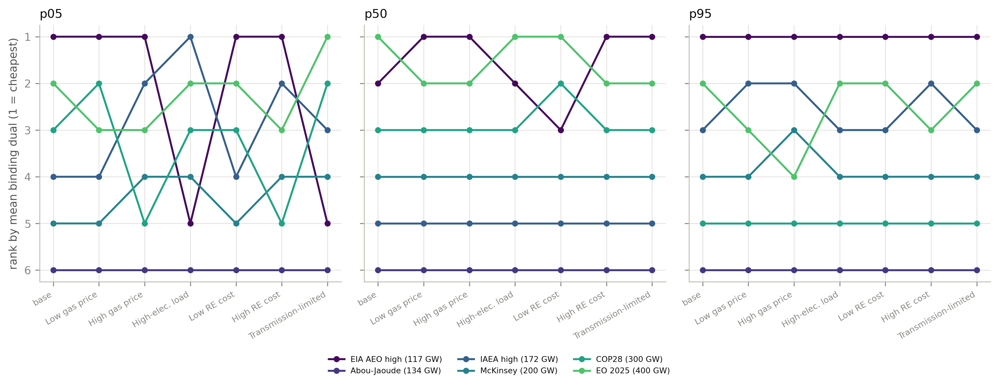

**Sources — edit the figure at its origin, not here:**

- `z-ethan\step4_analysis\figures\g04_ranking_bump.png` — generated by `step4_analysis/step4_analysis.ipynb` (cell 15) from `step4_analysis/exports/s03_ranking_preservation.csv`

In [21]:
P.show_panel(S4_FIG / "g04_ranking_bump.png")
P.source_ref(
    (S4_FIG / "g04_ranking_bump.png", "step4_analysis/step4_analysis.ipynb", "cell 15",
     "`step4_analysis/exports/s03_ranking_preservation.csv`"),
)

## SF22 — How much the subsidy level moves, by market world

**What this shows.** The dual-level ratio of each sensitivity run to its
base run. Medians by arm: low gas +18%, high gas −27%, high demand −8%,
cheap renewables +9%, dear renewables −10%, transmission-limited −5%
(per-case range 0.35–1.77). Every arm with a prior-signed prediction moves
in the predicted direction (`s05`).

z-ethan\step4_analysis\figures\g05_level_ratios.png  (generated 2026-08-18 15:11)


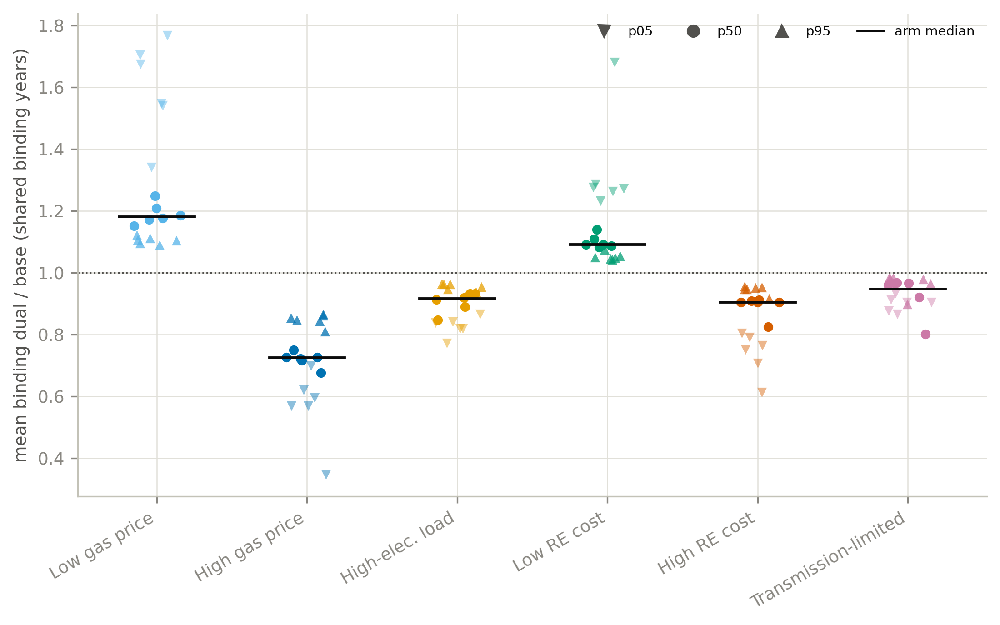

**Sources — edit the figure at its origin, not here:**

- `z-ethan\step4_analysis\figures\g05_level_ratios.png` — generated by `step4_analysis/step4_analysis.ipynb` (cell 18) from `step4_analysis/exports/s04_level_ratios.csv`; mechanism table: `s05_mechanism_color.csv`

z-ethan\step4_analysis\exports\s05_mechanism_color.csv


,sens,prior,median_ratio,frac_cases_above_1,verdict
0,gaslo,>1,1.181,1.0,agrees
1,gashi,<1,0.725,0.0,agrees
2,demhi,<1,0.916,0.0,agrees
3,relo,>1,1.091,1.0,agrees
4,rehi,<1,0.905,0.0,agrees
5,translim,none,0.948,0.0,no prior


In [22]:
P.show_panel(S4_FIG / "g05_level_ratios.png")
P.source_ref(
    (S4_FIG / "g05_level_ratios.png", "step4_analysis/step4_analysis.ipynb", "cell 18",
     "`step4_analysis/exports/s04_level_ratios.csv`; mechanism table: `s05_mechanism_color.csv`"),
)
P.table(S4_EXP / "s05_mechanism_color.csv", round_=3)

## Gap re-exports — three quotable results that had no static figure

`mc/winner_boundary.ipynb` and `mc/npv_winner_check.ipynb` hold three
quotable results but write no PNGs (their figures are interactive). The
three cells below rebuild them as static figures, mirroring those
notebooks' logic, with the exported summary tables as cross-checks.

They need the local per-draw export `mc/exports/mc_perdraw.npz` (50 MB,
gitignored, regenerable by `mc/mc_cost_trajectories.ipynb`). If the file
is absent, the cells print a skip message instead of failing.

All three use the McKinsey schedule (200 GW) as the representative
schedule, matching the source notebooks. The two "dials" are copula
percentiles: U0 = the learning dial (0 slow → 1 fast, both technologies
move together), U1 = the starting-cost dial (0 cheap → 1 expensive).

In [23]:
import numpy as np

NPZ = MC_EXP / "mc_perdraw.npz"
HAVE_NPZ = NPZ.exists()
if HAVE_NPZ:
    Z = np.load(NPZ)
    WCOLS = [str(c) for c in Z["world_columns"]]
    YEARS, DISC = Z["years"], Z["disc"]
    REP_TOK, REP_NAME = "mckinsey", "McKinsey GEP 2025"
    w = pd.DataFrame(Z[f"worlds_{REP_TOK}"], columns=WCOLS)
    d = pd.DataFrame({
        "U0": (w["lr_large"] - 0.03) / 0.09,
        "U1": (w["boak_large"] - 5250.0) / 2500.0,
        "conv_full": w["conv_full"].astype(int),
        "n_vendors": w["n_vendors"].astype(int),
    })
    # the comonotone-dial identities the source notebooks assert
    assert np.allclose(w["lr_smr"], 0.03 + 0.13 * d["U0"])
    assert np.allclose(w["boak_smr"], 5500.0 + 4500.0 * d["U1"])
    Rl, Rs = Z[f"R_{REP_TOK}_large"], Z[f"R_{REP_TOK}_smr"]
    d["m_pct"] = 200.0 * (Rl - Rs) / (Rl + Rs)   # SMR advantage, % of program cost
    d["winner"] = Z[f"winners_{REP_TOK}"].astype(str)
    assert ((d["winner"] == "large") == (Rl <= Rs)).all()
    # cross-check the exported headline: P(smr wins) for the representative schedule
    wbh = pd.read_csv(MC_EXP / "wb_headline.csv", index_col=0)
    p_smr = (d["winner"] == "smr").mean()
    assert abs(p_smr - wbh.loc[REP_NAME, "P(smr wins)"]) <= 5e-4 + 1e-9
    print(f"loaded {NPZ.name}; {REP_NAME}: P(smr wins) = {p_smr:.3f} (matches wb_headline.csv)")
else:
    print(f"SKIP: {NPZ} not found - run mc/mc_cost_trajectories.ipynb (S10b) to regenerate.")

loaded mc_perdraw.npz; McKinsey GEP 2025: P(smr wins) = 0.867 (matches wb_headline.csv)


### Gap 1 — The two-dial flip map

**What this shows.** Every cost world placed on the two dials (learning,
starting cost), colored by who wins the program. The black contour is the
flip boundary. Large reactors win only in the slow-learning, expensive
corner; SMR wins everywhere else.

*Mirrors `winner_boundary.ipynb` section W4 (cell 11).*

saved -> figures\SFgap1_two_dial_flip_map.png


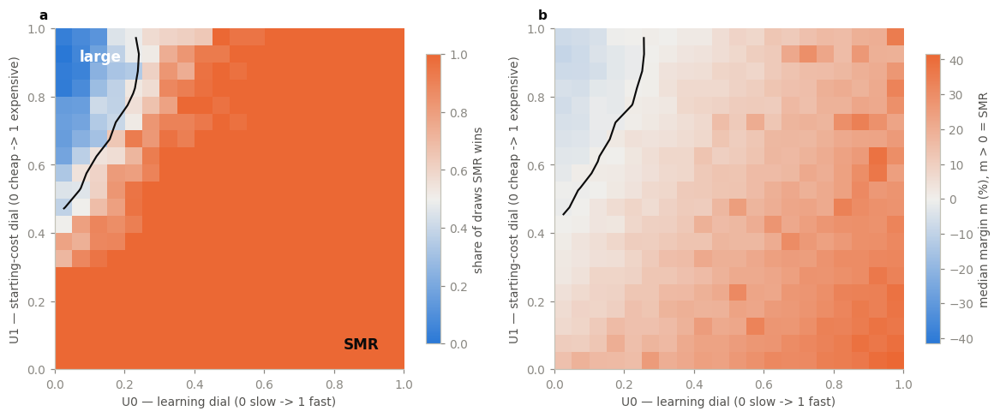


--- draft caption [SF gap 1] ---
The winner-flip boundary on the two cost dials (McKinsey GEP 2025 schedule, 10,000 draws). a,
share of draws the 100%-SMR program wins per bin, with the 50% contour. b, median cost margin (%
of program cost) with the zero contour. Large reactors win only in the slow-learning, expensive-
anchor corner.


In [24]:
if HAVE_NPZ:
    import matplotlib.pyplot as plt
    from matplotlib.colors import TwoSlopeNorm
    from scipy.ndimage import uniform_filter

    P.apply_style()
    CMAP_DIV = P.cmap_div()

    def binned_grid(dd, value, mask=None, nbins=20, stat="median"):
        m = np.ones(len(dd), bool) if mask is None else np.asarray(mask)
        x, y = dd["U0"].to_numpy()[m], dd["U1"].to_numpy()[m]
        v = (dd[value].to_numpy()[m] if isinstance(value, str)
             else np.asarray(value)[m]).astype(float)
        edges = np.linspace(0, 1, nbins + 1)
        ix = np.clip(np.digitize(x, edges) - 1, 0, nbins - 1)
        iy = np.clip(np.digitize(y, edges) - 1, 0, nbins - 1)
        grid = np.full((nbins, nbins), np.nan)
        for j in range(nbins):
            for i in range(nbins):
                sel = (ix == i) & (iy == j)
                if sel.any():
                    grid[j, i] = (np.median(v[sel]) if stat == "median" else v[sel].mean())
        return 0.5 * (edges[:-1] + edges[1:]), grid

    def smooth(grid):
        return uniform_filter(np.where(np.isnan(grid), np.nanmedian(grid), grid),
                              size=3, mode="nearest")

    C20, WIN = binned_grid(d, (d["winner"] == "smr").to_numpy(), stat="mean")
    _, MARGIN = binned_grid(d, "m_pct")
    X, Y = np.meshgrid(C20, C20)

    fig, axes = plt.subplots(1, 2, figsize=(10.8, 4.5))
    for ax, grid, norm, lvl, cblab in (
            (axes[0], WIN, TwoSlopeNorm(vcenter=0.5, vmin=0, vmax=1), [0.5],
             "share of draws SMR wins"),
            (axes[1], MARGIN,
             TwoSlopeNorm(vcenter=0.0, vmin=-np.nanmax(np.abs(MARGIN)),
                          vmax=np.nanmax(np.abs(MARGIN))), [0.0],
             "median margin m (%), m > 0 = SMR")):
        im = ax.imshow(grid, origin="lower", extent=[0, 1, 0, 1], cmap=CMAP_DIV,
                       norm=norm, aspect="auto", interpolation="nearest")
        ax.contour(X, Y, smooth(grid), levels=lvl, colors=[P.INK], linewidths=1.4)
        ax.set_xlabel("U0 — learning dial (0 slow -> 1 fast)")
        ax.set_ylabel("U1 — starting-cost dial (0 cheap -> 1 expensive)")
        ax.grid(False)
        plt.colorbar(im, ax=ax, shrink=0.85, label=cblab)
    axes[0].text(0.93, 0.06, "SMR", color=P.INK, fontsize=11, ha="right", fontweight="bold")
    axes[0].text(0.07, 0.94, "large", color="white", fontsize=11, va="top", fontweight="bold")
    P.panel_letter(axes[0], "a")
    P.panel_letter(axes[1], "b")
    fig.tight_layout()
    P.savefig(fig, "SFgap1_two_dial_flip_map.png")
    plt.show()
    P.caption("SF gap 1", f'''
    The winner-flip boundary on the two cost dials ({REP_NAME} schedule, 10,000 draws).
    a, share of draws the 100%-SMR program wins per bin, with the 50% contour.
    b, median cost margin (% of program cost) with the zero contour. Large reactors
    win only in the slow-learning, expensive-anchor corner.
    ''')
else:
    print("SKIP (no mc_perdraw.npz)")

### Gap 2 — The learning-for-cost exchange rate

**What this shows.** The flip boundary by experience-base stratum, and the
exchange rate it implies. Along the boundary, each percentage point of
SMR's learning-rate edge over large buys a fixed amount of tolerable
starting-cost premium — about \$800/kW per point. Under the full-stock
convention (crediting the ~140-unit legacy fleet to large's experience
base) the boundary nearly vanishes: diluted learning weakens large's case.

*Mirrors `winner_boundary.ipynb` sections W5/W10 (cells 13, 26); the
break-even table is the exported `wb_breakeven.csv`.*

saved -> figures\SFgap2_exchange_rate_boundary.png


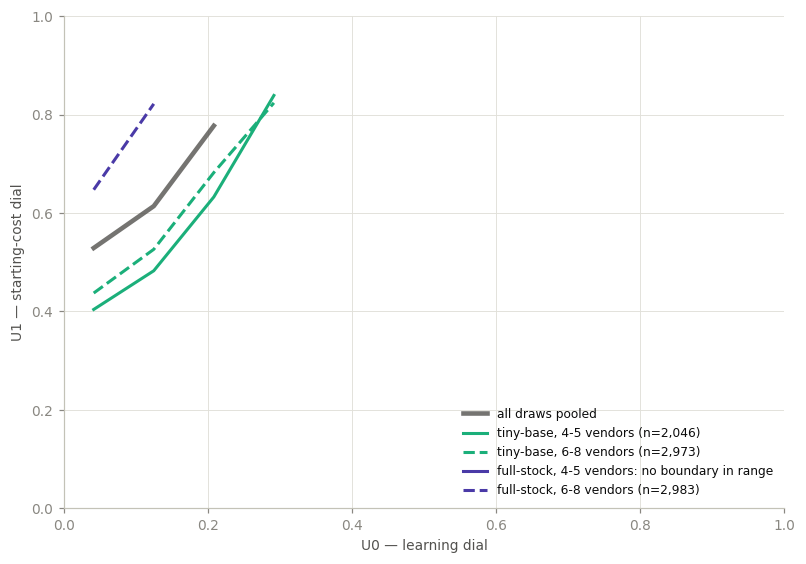

exchange rate (tiny-base boundary slope): ~823 $/kW of tolerable SMR anchor premium per pp of SMR's learning-rate edge (~366 $/kW per pp of the shared industry rate)
cross-check against the exported break-even table:
convention  U0  lr_large at U0 (%)  break-even U1*  break-even boak_large (2022$/kW)  break-even boak_smr (2022$/kW)  break-even SMR premium (2022$/kW)
 tiny-base 0.1                 3.9            0.48                           6457.21                         7672.99                            1215.77
 tiny-base 0.2                 4.8            0.65                           6874.49                         8424.09                            1549.59
 tiny-base 0.3                 5.7            0.83                           7322.97                         9231.35                            1908.38
full-stock 0.1                 3.9            0.79                           7230.26                         9064.47                            1834.21
full-stock 0.2         

In [25]:
if HAVE_NPZ:
    import matplotlib.pyplot as plt

    def boundary_curve(dd, mask, nbins=12):
        cc, g = binned_grid(dd, "m_pct", mask=mask, nbins=nbins)
        gs = smooth(g)
        u1s = np.full(len(cc), np.nan)
        for i in range(len(cc)):
            col = gs[:, i]
            if np.nanmin(col) < 0 < np.nanmax(col):
                ok = ~np.isnan(col)
                u1s[i] = np.interp(0.0, col[ok][::-1], cc[ok][::-1])
        return cc, u1s

    STRATA = [("tiny-base, 4-5 vendors", (d["conv_full"] == 0) & (d["n_vendors"] <= 5), P.C_TINY, "-"),
              ("tiny-base, 6-8 vendors", (d["conv_full"] == 0) & (d["n_vendors"] >= 6), P.C_TINY, "--"),
              ("full-stock, 4-5 vendors", (d["conv_full"] == 1) & (d["n_vendors"] <= 5), P.C_FULL, "-"),
              ("full-stock, 6-8 vendors", (d["conv_full"] == 1) & (d["n_vendors"] >= 6), P.C_FULL, "--")]

    fig, ax = plt.subplots(figsize=(7.4, 5.2))
    cc_all, u1_all = boundary_curve(d, None)
    ax.plot(cc_all, u1_all, color=P.MUTED, lw=3, alpha=0.8, label="all draws pooled")
    for name, mask, c, ls in STRATA:
        cc, u1s = boundary_curve(d, mask.to_numpy())
        if (~np.isnan(u1s)).sum() < 2:
            ax.plot([], [], color=c, ls=ls, lw=2, label=f"{name}: no boundary in range")
        else:
            ax.plot(cc, u1s, color=c, ls=ls, lw=2, label=f"{name} (n={int(mask.sum()):,})")
    ax.set_xlim(0, 1); ax.set_ylim(0, 1)
    ax.set_xlabel("U0 — learning dial")
    ax.set_ylabel("U1 — starting-cost dial")
    ax.legend(fontsize=8, loc="lower right")
    fig.tight_layout()
    P.savefig(fig, "SFgap2_exchange_rate_boundary.png")
    plt.show()

    # the exchange rate: slope of the tiny-base boundary
    cc_tb, u1_tb = boundary_curve(d, (d["conv_full"] == 0).to_numpy())
    ok = ~np.isnan(u1_tb)
    slope = np.polyfit(cc_tb[ok], u1_tb[ok], 1)[0]
    xrate_gap = 2000 * slope / 4.0   # $/kW premium per pp of SMR's lr edge over large
    xrate_lr = 2000 * slope / 9.0    # per pp of the industry-wide learning rate
    print(f"exchange rate (tiny-base boundary slope): ~{xrate_gap:,.0f} $/kW of tolerable"
          f" SMR anchor premium per pp of SMR's learning-rate edge"
          f" (~{xrate_lr:,.0f} $/kW per pp of the shared industry rate)")
    print("cross-check against the exported break-even table:")
    print(pd.read_csv(MC_EXP / "wb_breakeven.csv").to_string(index=False))
    P.caption("SF gap 2", f'''
    The flip boundary by experience-base stratum ({REP_NAME} schedule; SMR wins below
    each line). Along the tiny-base boundary, each percentage point of SMR's
    learning-rate edge buys ~{xrate_gap:,.0f} $/kW of tolerable starting-cost premium.
    Under the full-stock convention the boundary nearly vanishes: crediting the legacy
    fleet dilutes large's learning progression and weakens its case.
    ''')
else:
    print("SKIP (no mc_perdraw.npz)")

### Gap 3 — Does the winner survive non-capital costs? (NPV-margin scatter)

**What this shows.** The winner analysis above ranks programs by capital
cost only. This check adds the 30-year present value of fixed and variable
operations costs and fuel, per draw, and re-ranks. Each point is one world:
the capital-only margin against the full-NPV margin. Points hug the
45-degree line: operations costs nudge every margin but flip only
near-ties, and every flip starts inside the 2% close-call band.

*Mirrors `npv_winner_check.ipynb` sections N2–N4 (cells 6, 8, 11); the
summary table is the exported `npv_winner_summary.csv`. The operations-cost
stack is rebuilt here from in-repo inputs (ATB plant characteristics,
AEO uranium prices, the deflator), tied to the cost dial exactly as there:
fixed and variable O&M move with U1 from the ATB advanced to conservative
columns (the comonotone convention), and the capacity factor is the exported
replication value.*

QA green: P(smr) npv and flip counts match npv_winner_summary.csv (49 large->smr, 18 smr->large)


saved -> figures\SFgap3_npv_margin_scatter.png


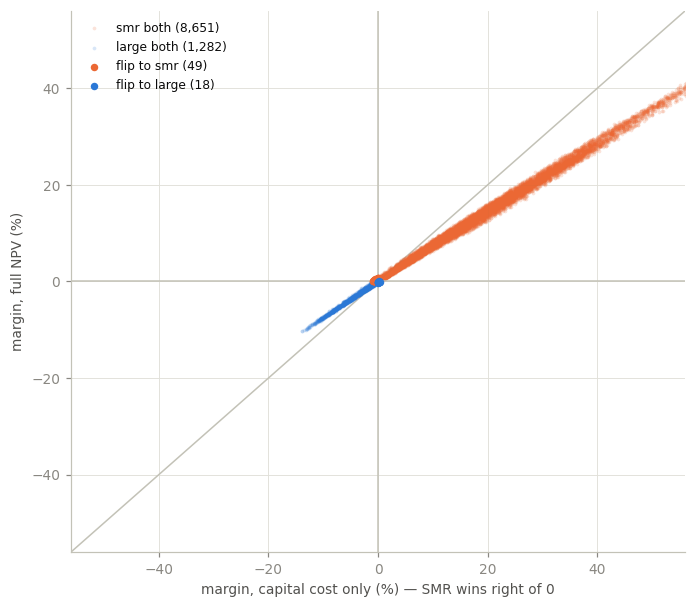


--- draft caption [SF gap 3] ---
Capital-only vs full-NPV winner margins (McKinsey GEP 2025 schedule). Adding the 30-year present
value of O&M and fuel (tied to the cost dial) shifts every margin slightly and flips only near-
ties: 49 draws flip to SMR and 18 to large out of 10,000, all starting inside the 2% close-call
band.


In [26]:
if HAVE_NPZ:
    import matplotlib.pyplot as plt

    # --- rebuild the non-CAPEX stack (mirrors npv_winner_check cell 6) ---
    nws = pd.read_csv(MC_EXP / "npv_winner_summary.csv")
    CF = float(nws["CF"].iloc[0])
    d_real = float(DISC[-1] / DISC[-2])
    EVAL_YEARS = 30
    ks = np.arange(1, EVAL_YEARS + 1)
    pvf = float((d_real ** -ks).sum())

    def atb_row(tech, scen):
        f = P.REPO / "inputs" / "plant_characteristics" / f"{tech}_ATB_2024_{scen}.csv"
        return pd.read_csv(f).set_index("t").loc[2030]

    TECH_FILE = {"large": "nuclear", "smr": "nuclear-smr"}
    OM = {}
    for t in ["large", "smr"]:
        adv, con, mod = (atb_row(TECH_FILE[t], s) for s in
                         ["advanced", "conservative", "moderate"])
        OM[t] = {"fom": (float(adv["fom"]), float(con["fom"])),
                 "vom": (float(adv["vom"]), float(con["vom"])),
                 "hr": float(mod["heatrate"])}

    defl = pd.read_csv(P.REPO / "inputs" / "financials" / "deflator.csv")
    defl.columns = ["year", "deflator"]
    defl = defl.set_index("year")["deflator"]
    U2022 = float(defl.loc[2025] / defl.loc[2022])
    uran = pd.read_csv(P.REPO / "inputs" / "fuelprices" /
                       "uranium_AEO_2026_baseline.csv").set_index("year")["cost"]
    Pu = (uran * U2022).reindex(range(2024, int(YEARS.max()) + EVAL_YEARS + 1)).ffill()

    MWH_PER_KWYR = 8.760

    def fuel_pv(tech):
        out = np.zeros(len(YEARS))
        for j, t in enumerate(YEARS):
            out[j] = (Pu.loc[t + 1: t + EVAL_YEARS].to_numpy() * (d_real ** -ks)).sum()
        return CF * MWH_PER_KWYR * OM[tech]["hr"] * out

    def om_npv(tech, U1):
        lo_f, hi_f = OM[tech]["fom"]
        lo_v, hi_v = OM[tech]["vom"]
        fom = lo_f + np.asarray(U1)[:, None] * (hi_f - lo_f)
        vom = lo_v + np.asarray(U1)[:, None] * (hi_v - lo_v)
        return pvf * (fom + CF * MWH_PER_KWYR * vom) + fuel_pv(tech)[None, :]

    w_t = Z[f"gw_additions_{REP_TOK}"] / DISC
    m_capex = d["m_pct"].to_numpy()
    Rn = {}
    for t in ["large", "smr"]:
        Rn[t] = Z[f"R_{REP_TOK}_{t}"] + om_npv(t, d["U1"].to_numpy()) @ w_t
    m_npv = 200.0 * (Rn["large"] - Rn["smr"]) / (Rn["large"] + Rn["smr"])
    win_npv = np.where(Rn["large"] <= Rn["smr"], "large", "smr")

    # cross-check the exported summary for the representative schedule
    row = nws.set_index("schedule").loc[REP_NAME]
    assert abs((win_npv == "smr").mean() - row["P(smr) npv"]) <= 5e-4 + 1e-9
    fl = int(((d["winner"] == "large") & (win_npv == "smr")).sum())
    fs = int(((d["winner"] == "smr") & (win_npv == "large")).sum())
    assert (fl, fs) == (int(row["flips large->smr"]), int(row["flips smr->large"]))
    print(f"QA green: P(smr) npv and flip counts match npv_winner_summary.csv "
          f"({fl} large->smr, {fs} smr->large)")

    cls = np.select(
        [(d["winner"] == "smr") & (win_npv == "smr"),
         (d["winner"] == "large") & (win_npv == "large"),
         (d["winner"] == "large") & (win_npv == "smr"),
         (d["winner"] == "smr") & (win_npv == "large")],
        ["smr both", "large both", "flip to smr", "flip to large"])

    fig, ax = plt.subplots(figsize=(6.4, 5.6))
    for name, color, alpha, size, z in [
            ("smr both", P.COL["smr"], 0.18, 6, 2),
            ("large both", P.COL["large"], 0.18, 6, 2),
            ("flip to smr", P.COL["smr"], 1.0, 24, 4),
            ("flip to large", P.COL["large"], 1.0, 24, 4)]:
        sel = cls == name
        ax.scatter(m_capex[sel], m_npv[sel], s=size, lw=0, color=color, alpha=alpha,
                   zorder=z, label=f"{name} ({int(sel.sum()):,})")
    lim = np.nanpercentile(np.abs(np.r_[m_capex, m_npv]), 99.5)
    ax.plot([-lim, lim], [-lim, lim], color=P.EDGE_C, lw=1, zorder=1)
    ax.axhline(0, color=P.EDGE_C, lw=1)
    ax.axvline(0, color=P.EDGE_C, lw=1)
    ax.set_xlim(-lim, lim); ax.set_ylim(-lim, lim)
    ax.set_xlabel("margin, capital cost only (%) — SMR wins right of 0")
    ax.set_ylabel("margin, full NPV (%)")
    ax.legend(fontsize=8, loc="upper left")
    fig.tight_layout()
    P.savefig(fig, "SFgap3_npv_margin_scatter.png")
    plt.show()
    P.caption("SF gap 3", f'''
    Capital-only vs full-NPV winner margins ({REP_NAME} schedule). Adding the 30-year
    present value of O&M and fuel (tied to the cost dial) shifts every margin slightly
    and flips only near-ties: {fl} draws flip to SMR and {fs} to large out of 10,000,
    all starting inside the 2% close-call band.
    ''')
else:
    print("SKIP (no mc_perdraw.npz)")

## Supplementary tables (ST1–ST8)

Each table below is loaded from its checked export, displayed, and
re-exported to this notebook's `exports/` folder (Nature Energy ships
complex tables as csv). The source path in each cell is the file of record.

### ST1 — The claims ledger

The technology-comparison analysis pre-registered seven claims (C1–C7)
and recorded each verdict, including the failures (C2–C6 fail in specific
dependence cells; the paper reports them with the same prominence as the
passes).

In [27]:
P.table(MC_EXP / "tech_comparison" / "claims_ledger.csv", "ST1_claims_ledger.csv")

z-ethan\mc\exports\tech_comparison\claims_ledger.csv -> exports/ST1_claims_ledger.csv


,claim,statement,supported,region,source,numbers,falsified_by
0,C1,SMR is the majority pure-program winner (P > 0...,True,"all primary cells (κ diagonal + split probes),...",T5 robustness_map.csv,"min P(SMR) = 0.509 at (probe_lr1_boak0, EIA 20...",any primary cell with P(SMR) < 0.5
1,C2,"'when large wins, it wins narrowly': P95 of |m...",False,holds only where P95|m| < 5.0%: [],T5 large_win_margins.csv,max P95 |m| | large wins = 30.83% at (probe_lr...,tail above threshold anywhere (expected to fai...
2,C3,Pure-SMR minimizes expected program NPV among ...,False,"all primary cells, all schedules, NPV object, ...",T6 exante_ranking.csv,"beaten in 1 pairs, e.g. {('probe_lr1_boak0', '...",any fixed strategy (incl. hedge mixes) beating...
3,C4,Pure-SMR second-order stochastically dominates...,False,SSD fails in 41/42 pairs; CVaR95 downgrade als...,T6 dominance_tests.csv,"SSD holds in 1/42 (cell, schedule) pairs; FSD ...","an SSD crossing -> report location, downgrade ..."
4,C5,Perfect-information option value of the 2036 s...,False,"all primary cells, all schedules; 2036 boundar...",T7 adaptive_value.csv,max PI option value = 5.882% of expected progr...,>= 1% anywhere -> sequencing gets paper space
5,C6,C1 and C3 survive each single stress cell (OB ...,False,"anchor kappa cells {1, 0.5, 0} x single stress...",T9 (stress cells + cost-object algebra),"breaking cells: OB x1.5@ob@k100 (minP=0.002, C...",a breaking cell -> named in the paper with its...
6,C7,No claim is made outside the ordered orthant (...,True,claims C1-C6 conditional on the ordered orthan...,T9 scope cells,outside the orthant P(SMR) spans 0.503..0.858;...,n/a (a scope statement; stamped with the scope...


### ST2 — Band coverage

The layered coverage claim behind the three-case design: the P5–P95 case
pair covers 90% of program cost by construction; simultaneous path coverage
is 0.62–0.81; one-sided below-P95 coverage is 0.83–0.92.

In [28]:
P.table(MC_EXP / "smr100" / "band_coverage.csv", "ST2_band_coverage.csv", round_=3)

z-ethan\mc\exports\smr100\band_coverage.csv -> exports/ST2_band_coverage.csv


,schedule,scalar_by_construction,simult_cov_fincapex,cov_below_p95_fincapex,cov_above_p05_fincapex,simult_cov_occ,cov_below_p95_occ,cov_above_p05_occ,calibrated_pointwise_q
0,EIA 2026 AEO high,0.9,0.618,0.888,0.731,0.656,0.861,0.796,2.43
1,Abou-Jaoude mod,0.9,0.636,0.877,0.759,0.676,0.891,0.785,2.49
2,IAEA high,0.9,0.695,0.831,0.864,0.684,0.800,0.884,2.48
3,McKinsey GEP 2025,0.9,0.746,0.851,0.895,0.772,0.881,0.892,2.52
4,COP28 tripling pledge,0.9,0.712,0.864,0.848,0.745,0.873,0.872,2.54
5,2025 EO,0.9,0.805,0.916,0.889,0.787,0.899,0.888,2.58


### ST3 — Bounds record

The input-side possibility frontier: the parameter corners that bound the
plausible set (no frontier ReEDS runs exist; this is an input-space
record).

In [29]:
P.table(MC_EXP / "smr100" / "bounds_record.csv", "ST3_bounds_record.csv", round_=3)

z-ethan\mc\exports\smr100\bounds_record.csv -> exports/ST3_bounds_record.csv


,schedule,case,score,pctile_in_MC,u,s,dur_lambda,ces_rho,conv_full,n_vendors,U_lr,U_boak,x_ls,x_sl,dur_z
0,2025 EO,hi,2784514.0,100.0,0.0,1.0,0.3,1.0,1.0,8.0,0.0,1.0,0.15,0.15,2.33
1,2025 EO,lo,823011.0,0.0,1.0,1.0,0.0,1.0,0.0,4.0,1.0,0.0,0.15,0.15,-2.33
2,Abou-Jaoude mod,hi,306877.0,100.0,0.0,1.0,0.3,1.0,1.0,8.0,0.0,1.0,0.15,0.15,2.33
3,Abou-Jaoude mod,lo,107054.0,0.0,1.0,1.0,0.0,1.0,0.0,4.0,1.0,0.0,0.15,0.15,-2.33
4,COP28 tripling pledge,hi,1832211.0,100.0,0.0,1.0,0.3,1.0,1.0,8.0,0.0,1.0,0.15,0.15,2.33
5,COP28 tripling pledge,lo,564817.0,0.0,1.0,1.0,0.0,1.0,0.0,4.0,1.0,0.0,0.15,0.15,-2.33
6,EIA 2026 AEO high,hi,220789.0,100.0,0.0,1.0,0.3,1.0,1.0,8.0,0.0,1.0,0.15,0.15,2.33
7,EIA 2026 AEO high,lo,81936.0,0.0,1.0,1.0,0.0,1.0,0.0,4.0,1.0,0.0,0.15,0.15,-2.33
8,IAEA high,hi,765479.0,100.0,0.0,1.0,0.3,1.0,1.0,8.0,0.0,1.0,0.15,0.15,2.33
9,IAEA high,lo,261509.0,0.0,1.0,1.0,0.0,1.0,0.0,4.0,1.0,0.0,0.15,0.15,-2.33


### ST4 — Winner headline table

Win probabilities and margins per schedule (the wb_headline export):
P(SMR wins), median margins in percent and \$/kW, and the share of
close-call worlds.

In [30]:
P.table(MC_EXP / "wb_headline.csv", "ST4_wb_headline.csv", index_col=0, round_=3)

z-ethan\mc\exports\wb_headline.csv -> exports/ST4_wb_headline.csv


,P(smr wins),median m_pct (%),median m_usd (2022$/kW),IQR m_pct,share |m|<1%,share |m|<2%,share |m|<5%
EIA 2026 AEO high,0.819,9.255,817.061,14.404,0.057,0.116,0.286
Abou-Jaoude mod,0.854,12.375,1033.308,17.254,0.046,0.090,0.225
IAEA high,0.863,14.955,1161.309,20.403,0.041,0.083,0.195
McKinsey GEP 2025,0.867,15.874,1176.441,21.874,0.037,0.080,0.187
COP28 tripling pledge,0.878,18.940,1288.372,25.622,0.031,0.063,0.159
2025 EO,0.886,21.407,1347.426,27.059,0.028,0.059,0.143


### ST5 — Dual summary and bridge metrics, all cases

The full versions of Table 1's first two column groups: t03 (dual levels)
and t04 (bridge-shape metrics) for all 37 runs.

In [31]:
P.table(S3_EXP / "t03_dual_summary.csv", "ST5a_dual_summary.csv", round_=1)
P.table(S3_EXP / "t04_bridge_metrics.csv", "ST5b_bridge_metrics.csv", round_=3)

z-ethan\step3_analysis\exports\t03_dual_summary.csv -> exports/ST5a_dual_summary.csv
z-ethan\step3_analysis\exports\t04_bridge_metrics.csv -> exports/ST5b_bridge_metrics.csv


,case,peak_year,end_over_peak,first_year_below_half_peak,n_zero_dual_mandated_years
0,smr100_eia_p05,2038,0.03,2041.0,1
1,smr100_eia_p50,2038,0.76,NaN,0
2,smr100_eia_p95,2038,0.84,NaN,0
3,smr100_aj_p05,2031,0.19,2041.0,0
4,smr100_aj_p50,2033,0.83,NaN,0
5,smr100_aj_p95,2033,0.83,NaN,0
6,smr100_iaea_p05,2031,0.19,2034.0,0
7,smr100_iaea_p50,2031,0.31,2035.0,0
8,smr100_iaea_p95,2031,0.82,NaN,0
9,smr100_mck_p05,2031,0.13,2034.0,0


### ST6 — Required ITC rates, full table

The full year-by-year required-rate table (t09, regenerated 2026-08-18):
the year's status, the subsidy level, and both rate conventions — the
headline model convention (`i_model_*`: fin_mult inversion plus the 10%
monetization haircut; also the rate the decentralization runs feed back
into ReEDS) and the placed-in-service overnight-cost-only conversion
(`i_pis_*` = i_model x ccmult; a real owner's statutory rate lies between
the two).

In [32]:
P.table(S3_EXP / "t09_required_itc.csv", "ST6_required_itc_full.csv", round_=3)

z-ethan\step3_analysis\exports\t09_required_itc.csv -> exports/ST6_required_itc_full.csv


,case,t,status,S_t_2004_per_MW,n_build_regions,ccmult,i_model_min,i_model_max,i_model_headline,i_pis_min,i_pis_max,i_pis_headline,S_x_2p2GW_2024B,itc_insufficient,pis_insufficient
0,smr100_eia_p05,2038,rate,1571121.0,11,1.159,0.343,0.451,0.451,0.398,0.523,0.523,5.7,False,False
1,smr100_eia_p05,2041,rate,722158.0,6,1.125,0.196,0.240,0.240,0.220,0.270,0.270,2.6,False,False
2,smr100_eia_p05,2044,rate,160982.0,1,1.125,0.045,0.045,0.045,0.051,0.051,0.051,0.6,False,False
3,smr100_eia_p05,2047,slack: required ITC is zero,NaN,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,False,False
4,smr100_eia_p05,2050,rate,39471.0,4,1.125,0.012,0.014,0.014,0.013,0.016,0.016,0.1,False,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
381,large100_eo_p95,2038,rate,5364400.0,30,1.170,0.682,0.897,0.897,0.798,1.050,1.050,19.6,False,True
382,large100_eo_p95,2041,rate,5384739.0,31,1.170,0.694,0.913,0.913,0.812,1.069,1.069,19.7,False,True
383,large100_eo_p95,2044,rate,5555848.0,47,1.170,0.732,0.963,0.963,0.857,1.127,1.127,20.3,False,True
384,large100_eo_p95,2047,rate,5676328.0,49,1.170,0.762,1.003,1.003,0.892,1.173,1.173,20.7,True,True


### ST7 — Fiscal comparison and instrument benchmarks

Seven exports: the ITC outlay (t10), the outlay-versus-rental comparison
(t12), the floor/grant/credit comparison net of tax (t13), the
federal/state/zone rate-resolution ladder (t14), the mandate restated per
vintage with the cut/hold bracket (t17), the subsidy instrument menu
(t18), and the commitment-ITC schedule (t19).

In [33]:
P.table(S3_EXP / "t10_itc_outlay.csv", "ST7a_itc_outlay.csv", round_=2)
P.table(S3_EXP / "t12_fiscal_comparison.csv", "ST7b_fiscal_comparison.csv", index_col=0, round_=2)
P.table(S3_EXP / "t13_flat_grant.csv", "ST7c_grant_vs_credit.csv", round_=3)
P.table(S3_EXP / "t14_itc_resolution.csv", "ST7d_rate_resolution.csv", round_=3)
P.table(S3_EXP / "t17_mandate_perbuild.csv", "ST7e_mandate_perbuild.csv", round_=1)
P.table(S3_EXP / "t18_instrument_menu.csv", "ST7f_instrument_menu.csv", round_=2)
P.table(S3_EXP / "t19_commitment_itc.csv", "ST7g_commitment_itc.csv", round_=3)

z-ethan\step3_analysis\exports\t10_itc_outlay.csv -> exports/ST7a_itc_outlay.csv
z-ethan\step3_analysis\exports\t12_fiscal_comparison.csv -> exports/ST7b_fiscal_comparison.csv
z-ethan\step3_analysis\exports\t13_flat_grant.csv -> exports/ST7c_grant_vs_credit.csv
z-ethan\step3_analysis\exports\t14_itc_resolution.csv -> exports/ST7d_rate_resolution.csv
z-ethan\step3_analysis\exports\t17_mandate_perbuild.csv -> exports/ST7e_mandate_perbuild.csv
z-ethan\step3_analysis\exports\t18_instrument_menu.csv -> exports/ST7f_instrument_menu.csv
z-ethan\step3_analysis\exports\t19_commitment_itc.csv -> exports/ST7g_commitment_itc.csv


,case,t,i_commit_cut,i_commit_hold,i_model_headline,hold_over_model
0,smr100_eia_p05,2038,0.122,0.126,0.451,0.28
1,smr100_eia_p05,2041,0.053,0.059,0.240,0.25
2,smr100_eia_p05,2044,0.009,0.016,0.045,0.36
3,smr100_eia_p05,2050,0.001,0.014,0.014,1.00
4,smr100_eia_p50,2038,0.373,0.576,0.704,0.82
...,...,...,...,...,...,...
329,large100_eo_p95,2038,0.572,0.935,0.897,1.04
330,large100_eo_p95,2041,0.483,0.958,0.913,1.05
331,large100_eo_p95,2044,0.378,0.990,0.963,1.03
332,large100_eo_p95,2047,0.240,1.015,1.003,1.01


### ST8 — Validation registries

The two output-check registries (54 step3 checks; 52 step4 checks; all
PASS/INFO). The step4 extraction manifest (148 files with sha256 hashes)
is the archive-integrity record; we note it here and ship it as data.

In [34]:
s3c = P.table(S3C_EXP / "checks_summary.csv", "ST8a_step3_checks.csv")
print(s3c["status"].value_counts().to_string())
s4c = P.table(S4C_EXP / "checks_summary.csv", "ST8b_step4_checks.csv")
print(s4c["status"].value_counts().to_string())
print(f"extraction manifest: {len(pd.read_csv(S4C_EXP / 'extraction_manifest.csv'))} files"
      " with sha256 hashes (step4_checks/exports/extraction_manifest.csv)")

z-ethan\step3_checks\exports\checks_summary.csv -> exports/ST8a_step3_checks.csv
status
PASS    44
INFO    10
z-ethan\step4_checks\exports\checks_summary.csv -> exports/ST8b_step4_checks.csv
status
PASS    44
INFO     8
extraction manifest: 148 files with sha256 hashes (step4_checks/exports/extraction_manifest.csv)


## Output manifest

In [35]:
P.write_captions("appendix")
for f in sorted(P.OUT_FIG.glob("SF*.png")):
    print(f"figures/{f.name}")
for f in sorted(P.OUT_EXP.glob("ST*.csv")):
    print(f"exports/{f.name}")

5 captions -> z-ethan\paper_figures\exports\captions_appendix.txt
figures/SF13_cost_anatomy.png
figures/SF14_spread_and_npv.png
figures/SF16_atb_dial_marginals.png
figures/SF18_case_placement.png
figures/SF19_case_design_diagnostics.png
figures/SF6_mixed_build.png
figures/SFgap1_two_dial_flip_map.png
figures/SFgap2_exchange_rate_boundary.png
figures/SFgap3_npv_margin_scatter.png
exports/ST1_claims_ledger.csv
exports/ST2_band_coverage.csv
exports/ST3_bounds_record.csv
exports/ST4_wb_headline.csv
exports/ST5a_dual_summary.csv
exports/ST5b_bridge_metrics.csv
exports/ST6_required_itc_full.csv
exports/ST7a_itc_outlay.csv
exports/ST7b_fiscal_comparison.csv
exports/ST7c_grant_vs_credit.csv
exports/ST7d_rate_resolution.csv
exports/ST7e_mandate_perbuild.csv
exports/ST7f_instrument_menu.csv
exports/ST7g_commitment_itc.csv
exports/ST8a_step3_checks.csv
exports/ST8b_step4_checks.csv
